In [1]:
import numpy as np
from tqdm import tqdm
import matplotlib.pyplot as plt
from matplotlib import gridspec
import plotly.express as px
import os
import time
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, TensorDataset
from torchvision import transforms
import torchvision
from tqdm import tqdm 
from sklearn.metrics import confusion_matrix
import seaborn as sns
#from Pytorchtools import EarlyStopping
from sklearn.model_selection import KFold
import optuna
from optuna.integration import PyTorchLightningPruningCallback
from optuna.pruners import PercentilePruner
import pytorch_lightning as pl
from torch.nn import functional as F
from sklearn.model_selection import KFold
from optuna.visualization import plot_contour
from optuna.visualization import plot_edf
from optuna.visualization import plot_intermediate_values
from optuna.visualization import plot_optimization_history
from optuna.visualization import plot_parallel_coordinate
from optuna.visualization import plot_param_importances
from optuna.visualization import plot_slice
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
%matplotlib inline
%config InlineBackend.figure_format='retina'

In [2]:
# Check if the GPU is available
device = str(torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu"))
print(f'Selected device: {device}')

Selected device: cpu


# Homework 2

## Filippo Ziliotto: Mat 2017425

## Convolutional autoencoder

Load the dataset and apply the useful transformation to the data

In [3]:
train_transform = transforms.Compose([
  transforms.ToTensor(),
  #transforms.RandomHorizontalFlip(p=0.1),
  #transforms.Normalize((0.5,), (0.5,)),
  #transforms.RandomApply(torch.nn.ModuleList([transforms.GaussianBlur(kernel_size=(5, 9), sigma=(0.1, 2.0))]), p=0.3)
])

test_transform = transforms.Compose([
  transforms.ToTensor(),
  #transforms.Normalize((0.5,), (0.5,))
])

In [4]:
train_dataset = torchvision.datasets.FashionMNIST('FashionMNIST', train=True,
                                                  download=True, transform=train_transform)

test_dataset  = torchvision.datasets.FashionMNIST('FashionMNIST', train=False,
                                                  download=True, transform=test_transform)

In [5]:
train_size = int(0.8 * len(train_dataset)) #80% for the training 20% for the validation
val_size = len(train_dataset) - train_size
train_dataset, val_dataset = torch.utils.data.random_split(train_dataset, [train_size, val_size])

Visualization example to check everything is loaded properly

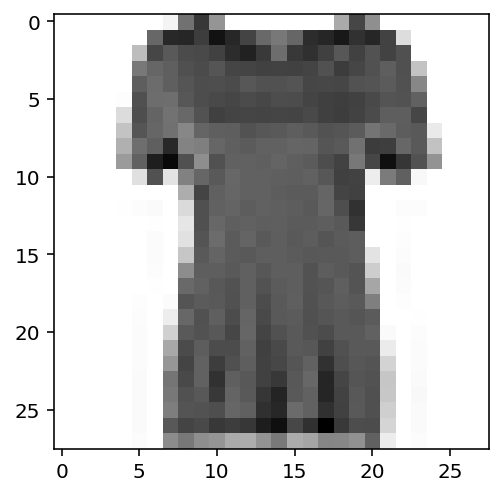

In [5]:
img = train_dataset[10][0].reshape(28,28,1)
plt.imshow(img, cmap='binary')
plt.show()

train_size = int(0.8 * len(train_dataset)) #80% for the training 20% for the validation
val_size = len(train_dataset) - train_size
train_dataset, val_dataset = torch.utils.data.random_split(train_dataset, [train_size, val_size])

print('Train size:',len(train_dataset))
print('Val size:',len(val_dataset))
print('Test size:',len(test_dataset))

In [6]:
batch_size = 64

train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_dataloader = DataLoader(val_dataset, batch_size=batch_size, shuffle=True)
test_dataloader = DataLoader(test_dataset, batch_size=1, shuffle=True)

In [7]:
for i in test_dataloader:
    print(i[0].dtype)
    print(i[1].dtype)
    break

torch.float32
torch.int64


### Architecture
Encoder / Decoder definitions

In [12]:
class Encoder(nn.Module):
    def __init__(self, latent_dim):

        super().__init__()

        self.conv1 = nn.Conv2d(in_channels=1, out_channels = 8, kernel_size=(3,3), padding=1, stride=2)
        self.conv2 = nn.Conv2d(in_channels=8, out_channels = 16, kernel_size=(3,3), padding=1, stride=2)
        self.conv3 = nn.Conv2d(in_channels=16, out_channels = 32, kernel_size=(3,3), padding=0, stride=2)
        
        self.flatten = nn.Flatten(start_dim=1)
        
        self.fc1   = nn.Linear(32*3*3, 200)
        self.fc2   = nn.Linear(200,latent_dim)
        
        #Activation definitions
        self.relu  = nn.ReLU()

        print('Encoder Initialized')

    def forward(self, x, additional_out=False):
        x = self.conv1(x)
        x = self.relu(x)
        x = self.conv2(x)
        x = self.relu(x)
        x = self.conv3(x)
        x = self.relu(x)
        x = self.flatten(x)
        x = self.fc1(x)
        x = self.relu(x)
        x = self.fc2(x)
        return x

In [13]:
class Decoder(nn.Module):
    def __init__(self,latent_dim):

        super().__init__()
         
        out_dim = 1       
        
        self.fc1   = nn.Linear(latent_dim,200)
        self.fc2   = nn.Linear(200, 32*3*3)
        
        self.unflatten = nn.Unflatten(dim=1, unflattened_size=(32, 3, 3))        

        self.conv1 = nn.ConvTranspose2d(in_channels=32, out_channels = 16,
                                        kernel_size=(3,3), padding=0, stride = 2, output_padding=0)
        self.conv2 = nn.ConvTranspose2d(in_channels=16, out_channels = 8,
                                        kernel_size=(3,3), padding=1, stride = 2, output_padding=1)
        self.conv3 = nn.ConvTranspose2d(in_channels=8, out_channels = 1,
                                        kernel_size=(3,3), padding=1, stride = 2, output_padding=1)

        #Activation definitions
        self.relu  = nn.ReLU()
        self.sigmoid = nn.Sigmoid()

        print('Decoder Initialized')

    def forward(self, x, additional_out=False):
        x = self.fc1(x)
        x = self.relu(x)
        x = self.fc2(x)
        x = self.relu(x)
        x = self.unflatten(x)
        x = self.conv1(x)
        x = self.relu(x)
        x = self.conv2(x)
        x = self.relu(x)
        x = self.conv3(x)
        x = self.sigmoid(x) #output values between [0,1]
        return x
    


In [14]:
### Set the random seed for reproducible results
torch.manual_seed(0)

### Initialize the two networks
latent_dim = 100
encoder = Encoder(latent_dim)
decoder = Decoder(latent_dim)

# Move both the encoder and the decoder to the selected device
print(encoder.to(device))
print(decoder.to(device))

Encoder Initialized
Decoder Initialized
Encoder(
  (conv1): Conv2d(1, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
  (conv2): Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
  (conv3): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2))
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (fc1): Linear(in_features=288, out_features=200, bias=True)
  (fc2): Linear(in_features=200, out_features=100, bias=True)
  (relu): ReLU()
)
Decoder(
  (fc1): Linear(in_features=100, out_features=200, bias=True)
  (fc2): Linear(in_features=200, out_features=288, bias=True)
  (unflatten): Unflatten(dim=1, unflattened_size=(32, 3, 3))
  (conv1): ConvTranspose2d(32, 16, kernel_size=(3, 3), stride=(2, 2))
  (conv2): ConvTranspose2d(16, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), output_padding=(1, 1))
  (conv3): ConvTranspose2d(8, 1, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), output_padding=(1, 1))
  (relu): ReLU()
  (sigmoid): Sigmoid()
)


In [15]:
model_parameters = filter(lambda p: p.requires_grad, encoder.parameters())
params1 = sum([np.prod(p.size()) for p in model_parameters])
print('Encoder parameters:',params1)

model_parameters = filter(lambda p: p.requires_grad, decoder.parameters())
params2 = sum([np.prod(p.size()) for p in model_parameters])
print('Decoder parameters:',params2)

print('Total number of parameters:',params2+params1)

Encoder parameters: 83788
Decoder parameters: 83945
Total number of parameters: 167733


Check if all the architecture is defined properly

In [16]:
img, _ = test_dataset[0]
img = img.unsqueeze(0) # Add the batch dimension in the first axis
print('Original image shape:', img.shape)

img_enc = encoder(img)
print('Encoded image shape:', img_enc.shape)

dec_img = decoder(img_enc)
print('Decoded image shape:', dec_img.shape)

Original image shape: torch.Size([1, 1, 28, 28])
Encoded image shape: torch.Size([1, 100])
Decoded image shape: torch.Size([1, 1, 28, 28])


### Training definitions

In [14]:
def train_epoch(encoder, decoder, dataloader, loss_fn, optimizer, device):

        #enable training mode
        encoder.train()
        decoder.train()
        
        ### TRAIN
        train_loss = []
        for sample_batched in tqdm(dataloader):

            #divide the batch into values and labels
            x_batch = sample_batched[0].to(device)

            #Forward pass
            encoded_data = encoder.forward(x_batch)
            decoded_data = decoder.forward(encoded_data) 
            out = decoded_data
            
            # Compute loss
            loss = loss_fn(out, x_batch)

            # Backpropagation
            optimizer.zero_grad()
            loss.backward()

            # Update the weights
            optimizer.step()

            # Save train loss for this batch
            loss_batch = loss.detach().cpu().numpy()
            train_loss.append(loss_batch)
            

        # Save average train loss
        train_loss_ = np.mean(train_loss)

        return train_loss_
    
def test_epoch(encoder, decoder, dataloader, loss_fn, device):
    # Set evaluation mode for encoder and decoder
    encoder.eval()
    decoder.eval()
    
    with torch.no_grad(): 
        
        conc_out = []
        conc_label = []
        for image_batch, _ in dataloader:
            
            image_batch = image_batch.to(device)
            # Encode data
            encoded_data = encoder(image_batch)
            # Decode data
            decoded_data = decoder(encoded_data)

            conc_out.append(decoded_data.cpu())
            conc_label.append(image_batch.cpu())

        conc_out = torch.cat(conc_out)
        conc_label = torch.cat(conc_label) 
        
        # Evaluate global loss
        val_loss = loss_fn(conc_out, conc_label)
    return val_loss.data

def reset_weights(model):
    for layer in model.children():
        if hasattr(layer, 'reset_parameters'):
            layer.reset_parameters()
            
def fit(num_epochs, encoder, decoder, dataloader_train, dataloader_test, optimizer, loss_fn, device, display=True):
    
    VALIDATION_LOSS =[]
    TRAINING_LOSS = []
    
    for epoch in range(num_epochs):
        print('EPOCH %d/%d' % (epoch + 1, num_epochs))
    
        ### Training (use the training function)
        train_loss = train_epoch(
            encoder=encoder, 
            decoder=decoder, 
            device=device, 
            dataloader= dataloader_train, 
            loss_fn=loss_fn, 
            optimizer=optim)
    
        ### Validation  (use the testing function)
        val_loss = test_epoch(
            encoder=encoder, 
            decoder=decoder, 
            device=device, 
            dataloader= dataloader_test, 
            loss_fn=loss_fn)
        
        # Print Validationloss
        print('\n\n\t VALIDATION - EPOCH %d/%d - loss: %f\n\n' % (epoch + 1, num_epochs, val_loss))
        
        TRAINING_LOSS.append(train_loss)
        VALIDATION_LOSS.append(val_loss)
        
        if display:
            nrow, ncol = 2,6
            fig = plt.figure(figsize=(ncol+1, nrow+1)) 

            gs = gridspec.GridSpec(nrow, ncol,
                 wspace=0.1, hspace=0.1, 
                 top=1.-0.5/(nrow+1), bottom=0.5/(nrow+1), 
                 left=0.5/(ncol+1), right=1-0.5/(ncol+1)) 

            for i in range(int(nrow/2)):
                np.random.seed(11)
                for j in range(ncol):
                    ax  = plt.subplot(gs[i,j])
                    ax1 = plt.subplot(gs[i+1,j])
        
                    k=np.random.randint(0,100)
                    img = test_dataset[k][0].unsqueeze(0).to(device)
                    with torch.no_grad():
                        rec_img  = decoder(encoder(img))
        
                    ax.imshow(img.cpu().squeeze().numpy(), cmap='gist_gray')
                    ax1.imshow(rec_img.cpu().squeeze().numpy(), cmap='gist_gray')
                    ax.axis('off')
                    ax1.axis('off')
                    ax.set_xticklabels([])
                    ax.set_yticklabels([])

                #plt.tight_layout() # do not use this!!
            plt.show()


        # Save network parameters
        torch.save(encoder.state_dict(), 'encoder_params.pth')
        torch.save(decoder.state_dict(), 'decoder_params.pth')

        # NOTE: Remember to save also the parameters of the optimizer if you want to restore and continue the training
    return TRAINING_LOSS, VALIDATION_LOSS

In [14]:
reset_weights(encoder)
reset_weights(decoder)

  0%|▎                                                                                 | 3/750 [00:00<00:27, 27.49it/s]

EPOCH 1/30


100%|████████████████████████████████████████████████████████████████████████████████| 750/750 [00:18<00:00, 40.55it/s]




	 VALIDATION - EPOCH 1/30 - loss: 0.034492




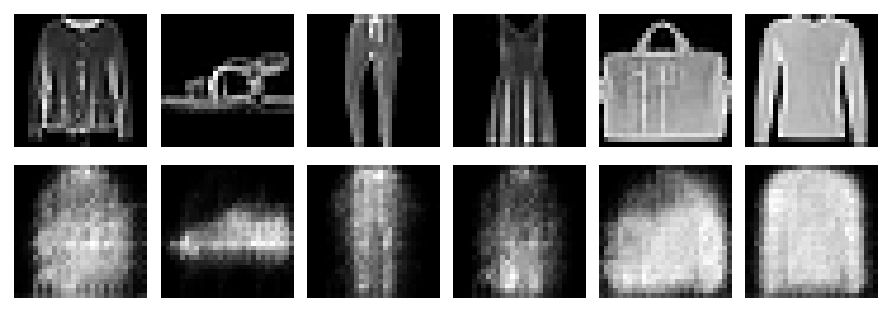

  0%|▎                                                                                 | 3/750 [00:00<00:25, 28.85it/s]

EPOCH 2/30


100%|████████████████████████████████████████████████████████████████████████████████| 750/750 [00:20<00:00, 36.39it/s]




	 VALIDATION - EPOCH 2/30 - loss: 0.025883




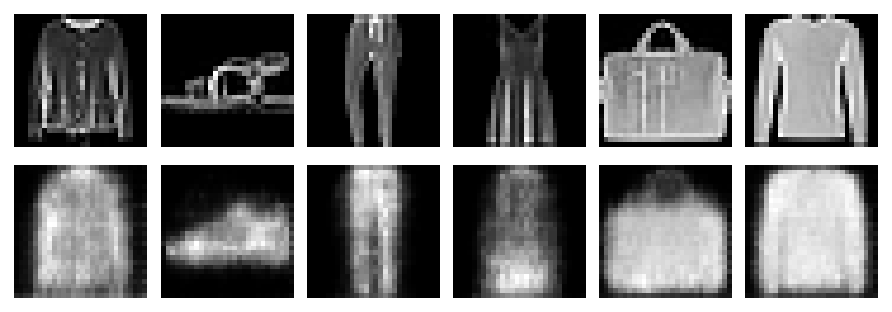

  1%|▍                                                                                 | 4/750 [00:00<00:22, 33.90it/s]

EPOCH 3/30


100%|████████████████████████████████████████████████████████████████████████████████| 750/750 [00:21<00:00, 34.35it/s]




	 VALIDATION - EPOCH 3/30 - loss: 0.022950




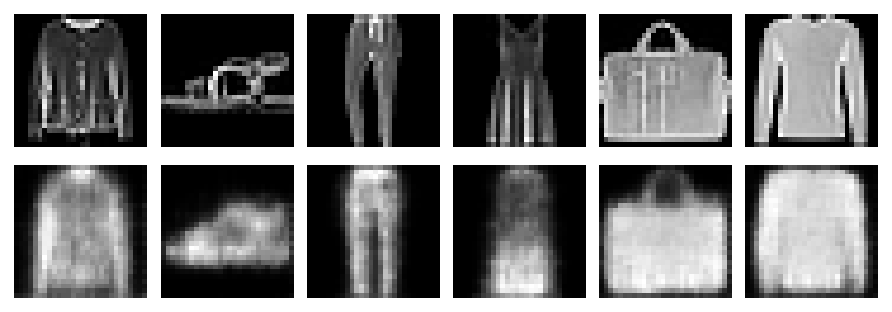

  1%|▍                                                                                 | 4/750 [00:00<00:21, 34.17it/s]

EPOCH 4/30


100%|████████████████████████████████████████████████████████████████████████████████| 750/750 [00:23<00:00, 31.36it/s]




	 VALIDATION - EPOCH 4/30 - loss: 0.021105




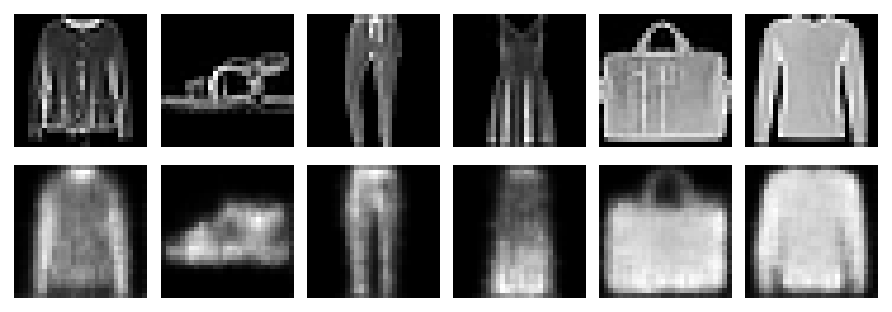

  0%|▎                                                                                 | 3/750 [00:00<00:24, 29.90it/s]

EPOCH 5/30


100%|████████████████████████████████████████████████████████████████████████████████| 750/750 [00:24<00:00, 31.12it/s]




	 VALIDATION - EPOCH 5/30 - loss: 0.019665




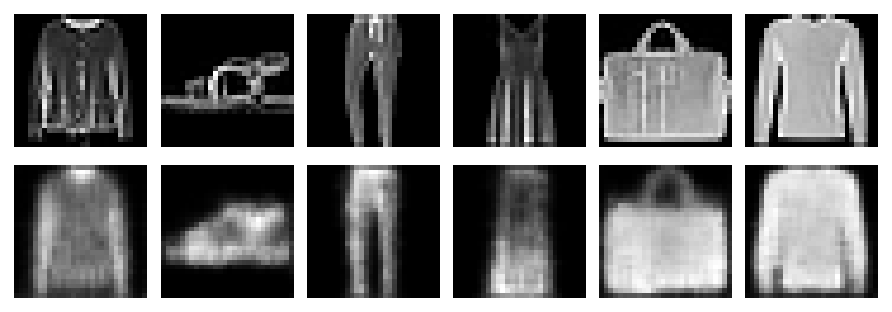

  1%|▍                                                                                 | 4/750 [00:00<00:21, 34.21it/s]

EPOCH 6/30


100%|████████████████████████████████████████████████████████████████████████████████| 750/750 [00:24<00:00, 31.09it/s]




	 VALIDATION - EPOCH 6/30 - loss: 0.019000




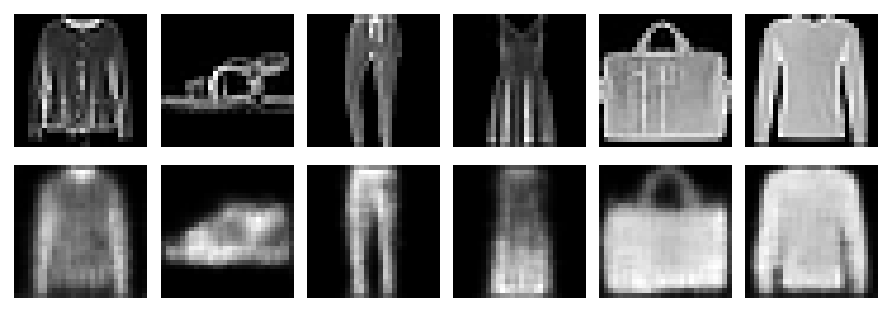

  1%|▍                                                                                 | 4/750 [00:00<00:21, 34.47it/s]

EPOCH 7/30


100%|████████████████████████████████████████████████████████████████████████████████| 750/750 [00:24<00:00, 31.00it/s]




	 VALIDATION - EPOCH 7/30 - loss: 0.018261




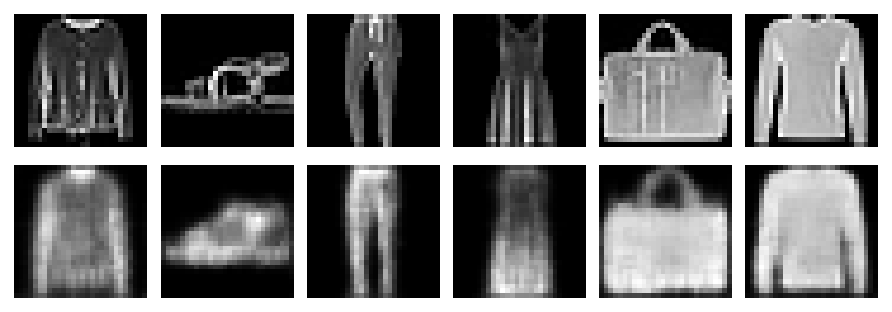

  1%|▍                                                                                 | 4/750 [00:00<00:22, 33.88it/s]

EPOCH 8/30


100%|████████████████████████████████████████████████████████████████████████████████| 750/750 [00:25<00:00, 29.96it/s]




	 VALIDATION - EPOCH 8/30 - loss: 0.017741




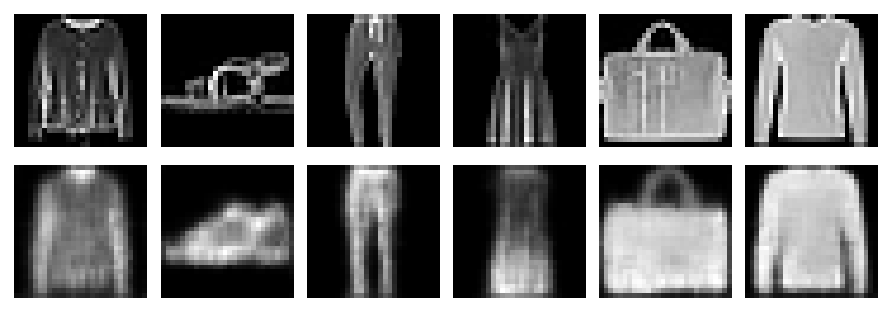

  1%|▍                                                                                 | 4/750 [00:00<00:21, 34.49it/s]

EPOCH 9/30


100%|████████████████████████████████████████████████████████████████████████████████| 750/750 [00:23<00:00, 32.53it/s]




	 VALIDATION - EPOCH 9/30 - loss: 0.017386




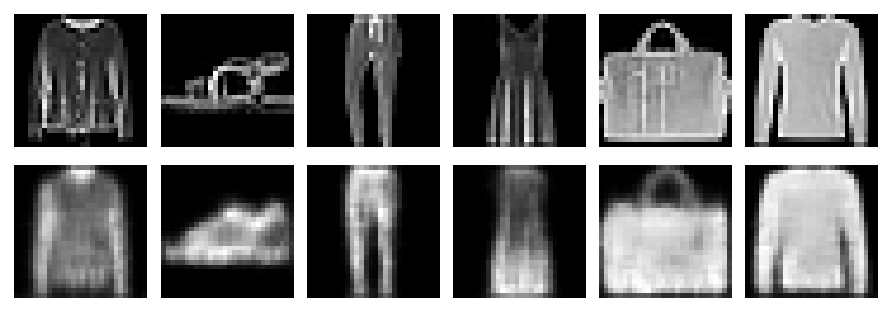

  0%|▎                                                                                 | 3/750 [00:00<00:25, 29.59it/s]

EPOCH 10/30


100%|████████████████████████████████████████████████████████████████████████████████| 750/750 [00:24<00:00, 30.50it/s]




	 VALIDATION - EPOCH 10/30 - loss: 0.017179




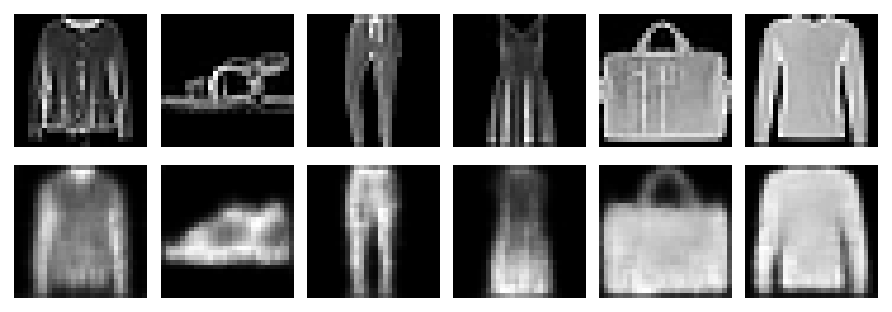

  1%|▍                                                                                 | 4/750 [00:00<00:21, 34.77it/s]

EPOCH 11/30


100%|████████████████████████████████████████████████████████████████████████████████| 750/750 [00:24<00:00, 30.78it/s]




	 VALIDATION - EPOCH 11/30 - loss: 0.016643




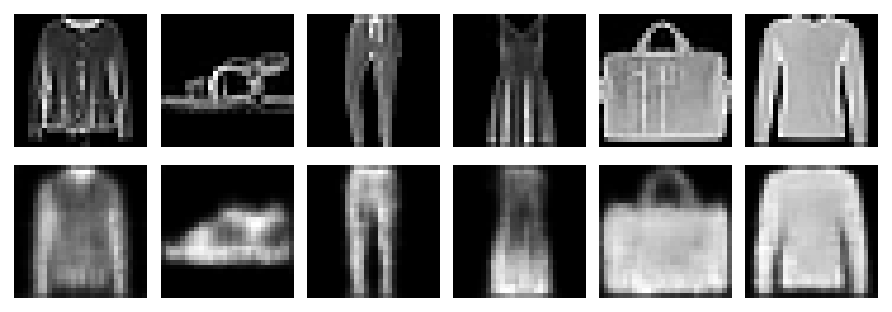

  0%|▎                                                                                 | 3/750 [00:00<00:25, 29.61it/s]

EPOCH 12/30


100%|████████████████████████████████████████████████████████████████████████████████| 750/750 [00:25<00:00, 29.98it/s]




	 VALIDATION - EPOCH 12/30 - loss: 0.016115




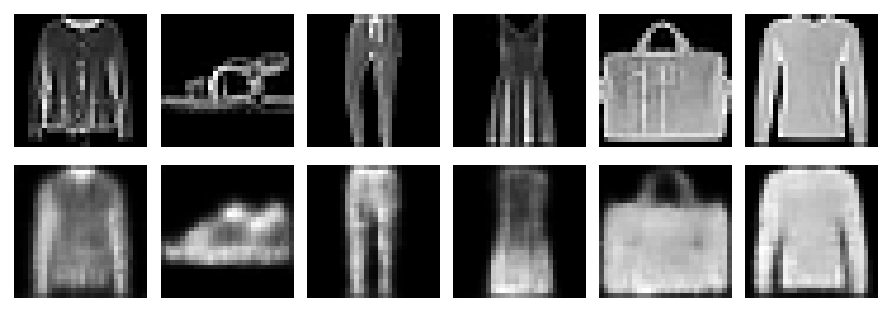

  1%|▍                                                                                 | 4/750 [00:00<00:21, 34.18it/s]

EPOCH 13/30


100%|████████████████████████████████████████████████████████████████████████████████| 750/750 [00:26<00:00, 28.31it/s]




	 VALIDATION - EPOCH 13/30 - loss: 0.015819




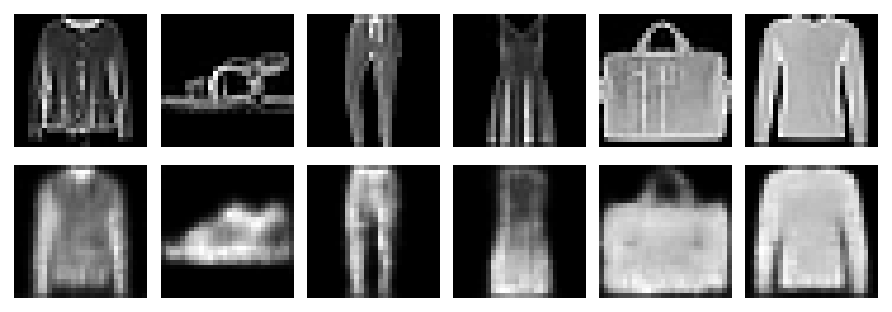

  0%|▎                                                                                 | 3/750 [00:00<00:24, 29.88it/s]

EPOCH 14/30


100%|████████████████████████████████████████████████████████████████████████████████| 750/750 [00:26<00:00, 28.58it/s]




	 VALIDATION - EPOCH 14/30 - loss: 0.015437




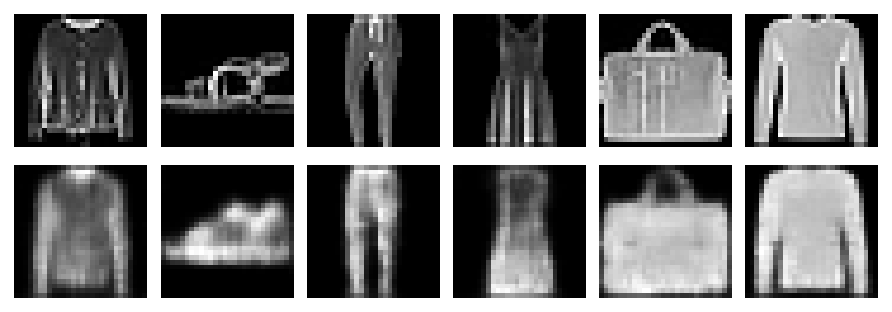

  0%|▎                                                                                 | 3/750 [00:00<00:31, 24.08it/s]

EPOCH 15/30


100%|████████████████████████████████████████████████████████████████████████████████| 750/750 [00:26<00:00, 28.06it/s]




	 VALIDATION - EPOCH 15/30 - loss: 0.015042




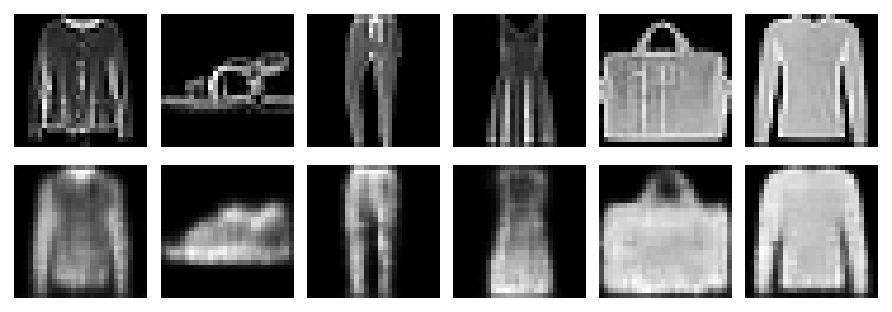

  1%|▍                                                                                 | 4/750 [00:00<00:24, 30.64it/s]

EPOCH 16/30


100%|████████████████████████████████████████████████████████████████████████████████| 750/750 [00:27<00:00, 27.57it/s]




	 VALIDATION - EPOCH 16/30 - loss: 0.014580




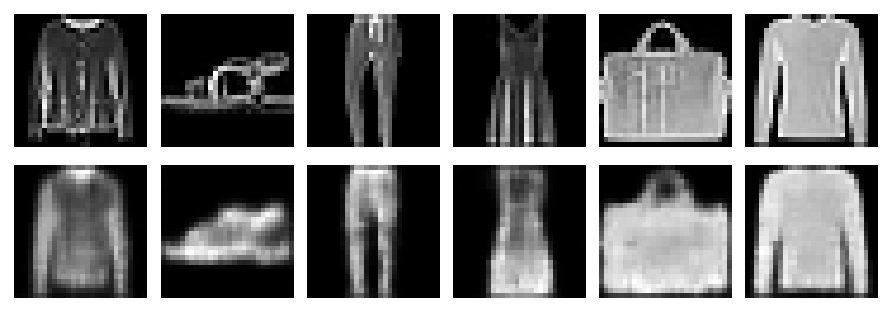

  0%|▎                                                                                 | 3/750 [00:00<00:25, 29.60it/s]

EPOCH 17/30


100%|████████████████████████████████████████████████████████████████████████████████| 750/750 [00:25<00:00, 28.93it/s]




	 VALIDATION - EPOCH 17/30 - loss: 0.014249




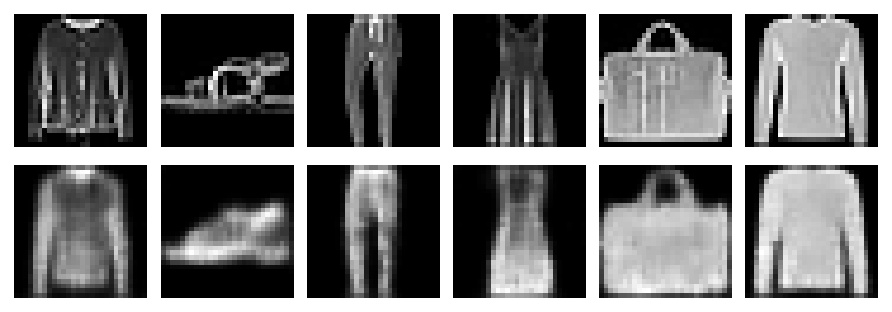

  0%|▎                                                                                 | 3/750 [00:00<00:32, 23.08it/s]

EPOCH 18/30


100%|████████████████████████████████████████████████████████████████████████████████| 750/750 [00:26<00:00, 28.51it/s]




	 VALIDATION - EPOCH 18/30 - loss: 0.014103




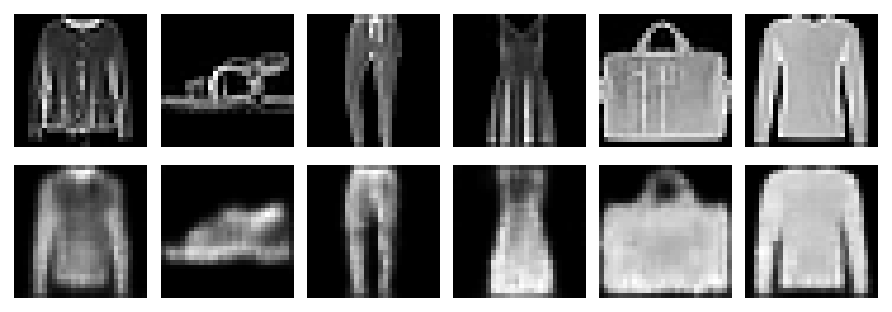

  0%|▎                                                                                 | 3/750 [00:00<00:25, 29.30it/s]

EPOCH 19/30


100%|████████████████████████████████████████████████████████████████████████████████| 750/750 [00:26<00:00, 27.78it/s]




	 VALIDATION - EPOCH 19/30 - loss: 0.013850




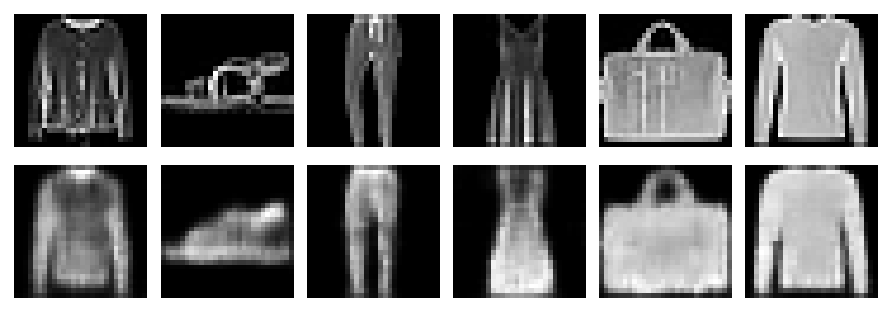

  1%|▋                                                                                 | 6/750 [00:00<00:24, 29.89it/s]

EPOCH 20/30


100%|████████████████████████████████████████████████████████████████████████████████| 750/750 [00:27<00:00, 27.14it/s]




	 VALIDATION - EPOCH 20/30 - loss: 0.013631




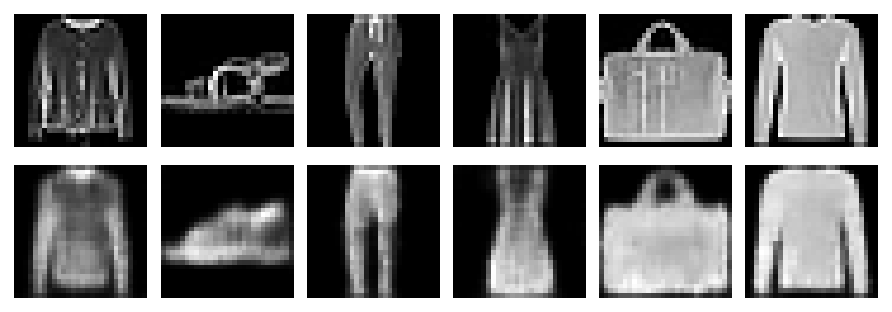

  0%|▎                                                                                 | 3/750 [00:00<00:29, 25.64it/s]

EPOCH 21/30


100%|████████████████████████████████████████████████████████████████████████████████| 750/750 [00:27<00:00, 27.19it/s]




	 VALIDATION - EPOCH 21/30 - loss: 0.013663




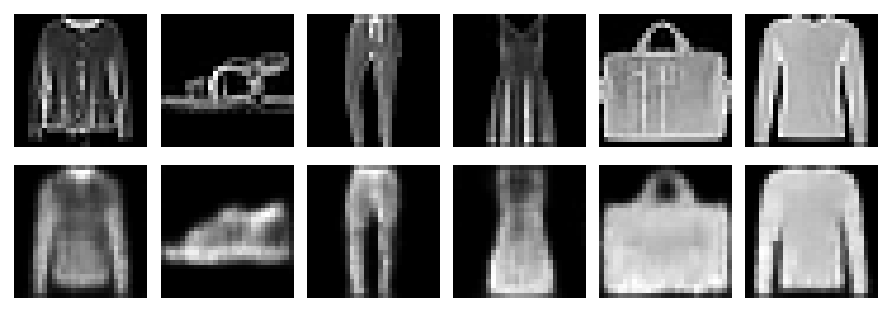

  0%|▎                                                                                 | 3/750 [00:00<00:28, 25.87it/s]

EPOCH 22/30


100%|████████████████████████████████████████████████████████████████████████████████| 750/750 [00:28<00:00, 26.76it/s]




	 VALIDATION - EPOCH 22/30 - loss: 0.013124




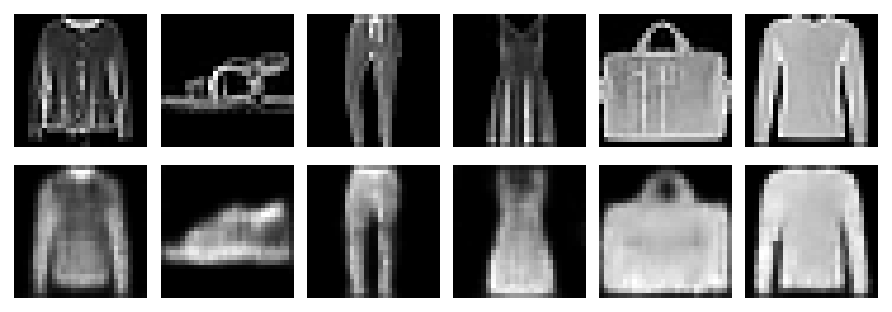

  0%|▎                                                                                 | 3/750 [00:00<00:33, 22.22it/s]

EPOCH 23/30


100%|████████████████████████████████████████████████████████████████████████████████| 750/750 [00:27<00:00, 26.93it/s]




	 VALIDATION - EPOCH 23/30 - loss: 0.012945




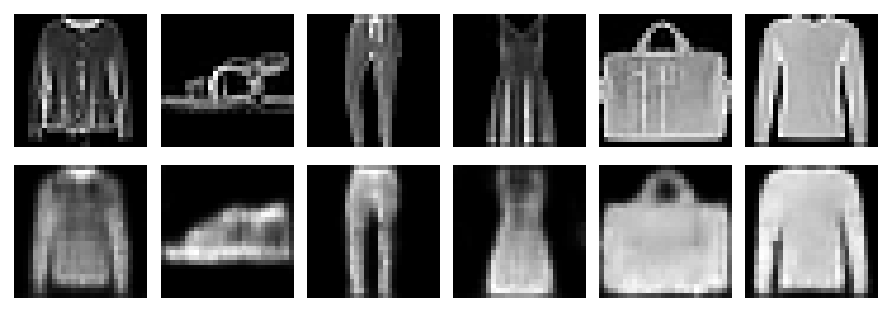

  0%|▎                                                                                 | 3/750 [00:00<00:25, 29.59it/s]

EPOCH 24/30


100%|████████████████████████████████████████████████████████████████████████████████| 750/750 [00:26<00:00, 27.87it/s]




	 VALIDATION - EPOCH 24/30 - loss: 0.012762




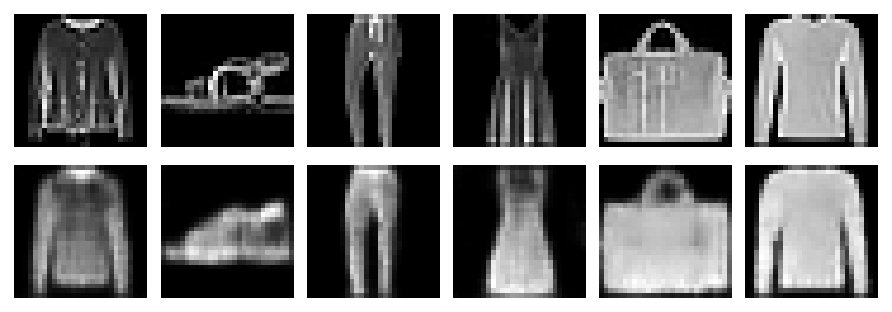

  1%|▋                                                                                 | 6/750 [00:00<00:25, 28.78it/s]

EPOCH 25/30


100%|████████████████████████████████████████████████████████████████████████████████| 750/750 [00:26<00:00, 28.45it/s]




	 VALIDATION - EPOCH 25/30 - loss: 0.012493




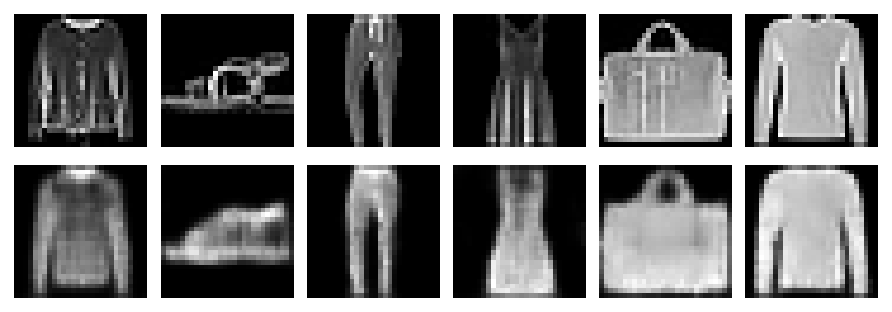

  0%|▎                                                                                 | 3/750 [00:00<00:24, 29.89it/s]

EPOCH 26/30


100%|████████████████████████████████████████████████████████████████████████████████| 750/750 [00:26<00:00, 28.70it/s]




	 VALIDATION - EPOCH 26/30 - loss: 0.012468




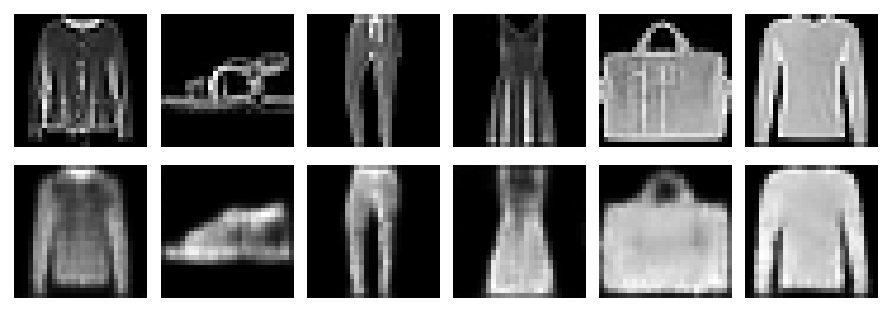

  0%|▎                                                                                 | 3/750 [00:00<00:26, 27.95it/s]

EPOCH 27/30


100%|████████████████████████████████████████████████████████████████████████████████| 750/750 [00:26<00:00, 28.48it/s]




	 VALIDATION - EPOCH 27/30 - loss: 0.012268




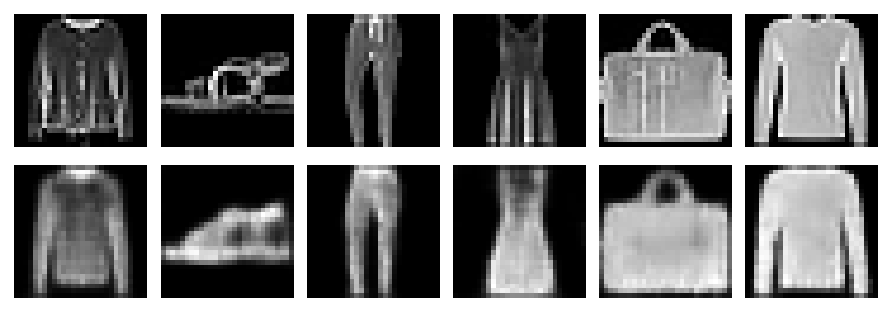

  0%|▎                                                                                 | 3/750 [00:00<00:26, 28.66it/s]

EPOCH 28/30


100%|████████████████████████████████████████████████████████████████████████████████| 750/750 [00:26<00:00, 28.32it/s]




	 VALIDATION - EPOCH 28/30 - loss: 0.012160




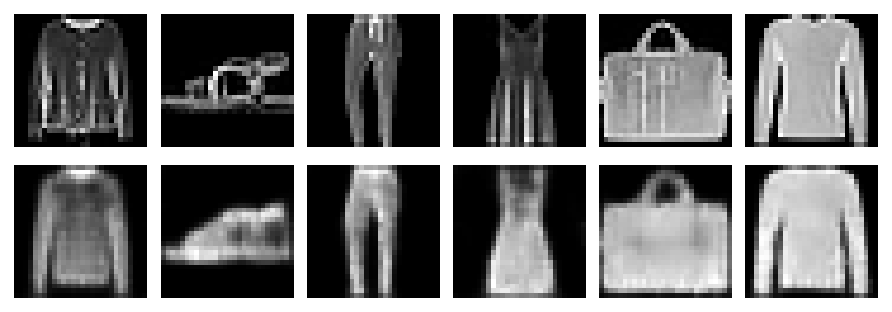

  0%|▎                                                                                 | 3/750 [00:00<00:25, 29.30it/s]

EPOCH 29/30


100%|████████████████████████████████████████████████████████████████████████████████| 750/750 [00:27<00:00, 27.06it/s]




	 VALIDATION - EPOCH 29/30 - loss: 0.012045




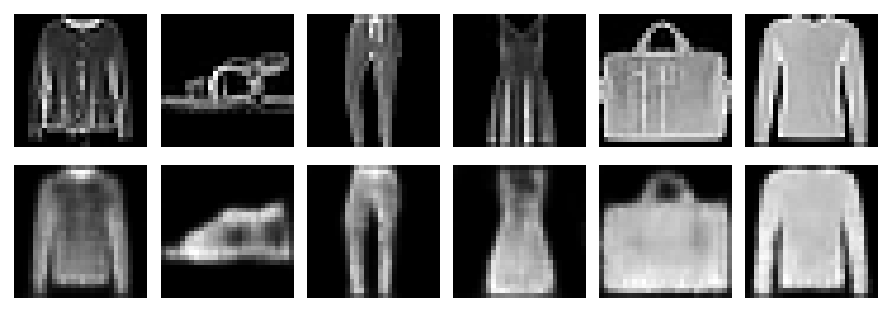

  0%|▎                                                                                 | 3/750 [00:00<00:31, 23.79it/s]

EPOCH 30/30


100%|████████████████████████████████████████████████████████████████████████████████| 750/750 [00:27<00:00, 27.01it/s]




	 VALIDATION - EPOCH 30/30 - loss: 0.011938




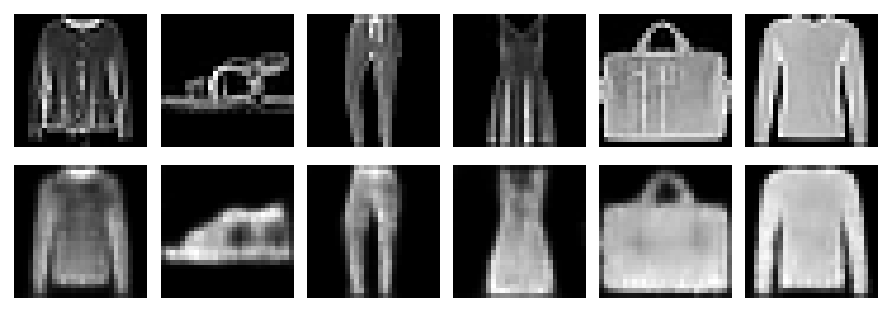

In [18]:
num_epochs = 30 #num epochs
loss_fn = torch.nn.MSELoss() #loss function

params_to_optimize = [
    {'params': encoder.parameters()},
    {'params': decoder.parameters()}
]
optim = torch.optim.Adam(params_to_optimize, lr=5e-4, weight_decay=1e-5) #optimizer

training_loss, validation_loss = fit(num_epochs, encoder, decoder,
                                     train_dataloader, test_dataloader, optim, loss_fn, 'cpu', display=True )

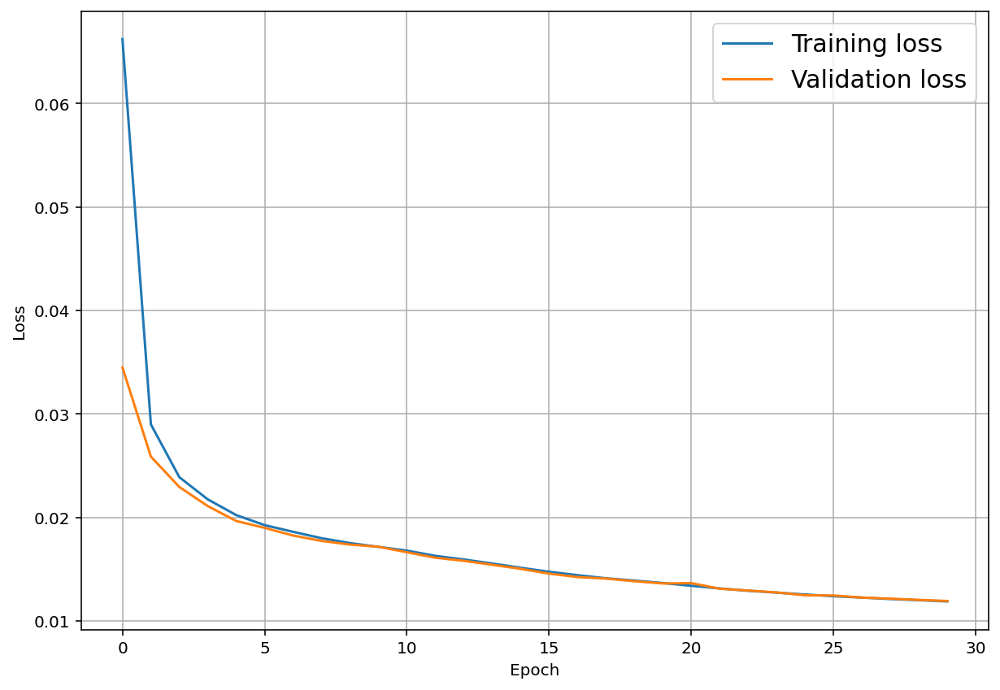

In [19]:
# Plot losses
plt.figure(figsize=(10,7))
plt.plot(training_loss, label='Training loss')
plt.plot(validation_loss, label='Validation loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.grid('on')
plt.legend(loc=1,prop={'size': 15})
plt.show()

## T-SNE for latent dimension

In [20]:
dict_ = {0:'T-shirt',1:'Trousers',2:'Pullover',3:'Dress',4:'Coat',
        5:'Sandal',6:'Shirt',7:'Sneaker',8:'Bag',9:'Ankle boot'}

### Get the encoded representation of the test samples
encoded_samples = []
for sample in tqdm(test_dataset):
    img = sample[0].unsqueeze(0).to(device)
    label = sample[1]
    # Encode image
    encoder.eval()
    with torch.no_grad():
        encoded_img  = encoder(img)
    # Append to list
    encoded_img = encoded_img.flatten().cpu().numpy()
    encoded_sample = {f"Variable_{i+1}": enc for i, enc in enumerate(encoded_img)}
    encoded_sample['label'] = label
    encoded_samples.append(encoded_sample)

encoded_samples = pd.DataFrame(encoded_samples)
encoded_samples['Name'] = encoded_samples['label'].map(dict_)
encoded_samples.iloc[:,-4:].head(6)

100%|██████████████████████████████████████████████████████████████████████████| 10000/10000 [00:06<00:00, 1568.71it/s]


,Variable_99,Variable_100,label,Name
0,0.359480,-6.274420,9,Ankle boot
1,-12.562709,3.674589,2,Pullover
2,6.767144,-2.776990,1,Trousers
3,4.155790,0.397270,1,Trousers
4,-7.280994,9.392704,6,Shirt
5,3.756975,0.336931,1,Trousers


In [21]:
tsne = TSNE(n_components=2, init='pca', learning_rate=2000)
encoded_samples_reduced_TSNE = tsne.fit_transform(encoded_samples.iloc[:,0:latent_dim])
encoded_tsne = pd.DataFrame(encoded_samples_reduced_TSNE, columns={'TSNE 1','TSNE 2'})
encoded_tsne = pd.concat([encoded_samples.iloc[:,-2:], encoded_tsne],axis=1)

fig = px.scatter(
    encoded_tsne, x=encoded_tsne['TSNE 1'], y=encoded_tsne['TSNE 2'],
    color=encoded_samples.Name, labels={'color': 'Name'}, opacity=.9,
    symbol='Name',
    #color_discrete_sequence=px.colors.qualitative.Pastel2
)

fig.update_traces(marker=dict(size=10,
                              line=dict(width=.4,
                                        color='Grey')),
                  selector=dict(mode='markers'))
fig.show()

C:\Users\filip\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


## Generate samples from latent dimension

I generated some random array in the latent space and feed them into the decoder to produce some output images. The random vectors are took in between the min and the max for each dimension

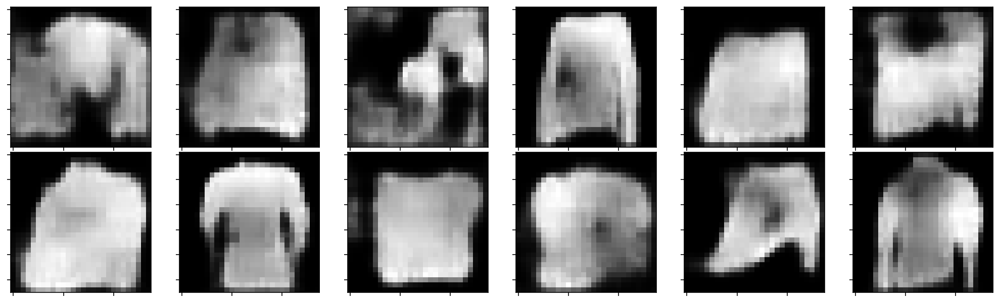

In [22]:
nrow, ncol = 2,6
fig = plt.figure(figsize=(20,20)) 
gs = gridspec.GridSpec(nrow, ncol, width_ratios=[1 for i in range(ncol)],
         wspace=0.2, hspace=0.0, top=1, bottom=0.8, left=0.17, right=0.845) 

np.random.seed(1411)
for i in range(nrow):
    for j in range(ncol):
        generated=[]
        for k in range(latent_dim):
            x = np.random.randint(min(encoded_samples.iloc[:,k]), 
                                  max(encoded_samples.iloc[:,k]),size=1) 
            generated.append(x)
        generated = np.array(generated).reshape(1,-1)
        
        with torch.no_grad():
            rec_img  = decoder(torch.tensor(generated).float())
            #rec_img  = decoder(encoder(rec_img))
        ax= plt.subplot(gs[i,j])
        ax.imshow(rec_img.cpu().squeeze().numpy(), cmap='gist_gray')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
plt.show()

## Classification fine-tuning the encoder 

In [23]:
train_dataset = torchvision.datasets.FashionMNIST('FashionMNIST', train=True,
                                                  download=True, transform=train_transform)

test_dataset  = torchvision.datasets.FashionMNIST('FashionMNIST', train=False,
                                                  download=True, transform=test_transform)

In [24]:
train_size = int(0.8 * len(train_dataset)) #80% for the training 20% for the validation
val_size = len(train_dataset) - train_size
train_dataset, val_dataset = torch.utils.data.random_split(train_dataset, [train_size, val_size])

In [47]:
batch_size = 128

train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_dataloader = DataLoader(val_dataset, batch_size=batch_size, shuffle=True)
test_dataloader = DataLoader(test_dataset, batch_size=1, shuffle=False)

In [12]:
def train_epoch(encoder, classification, dataloader, loss_fn, optimizer, device):

        #enable training mode
        encoder.eval()
        classification.train()
        
        ### TRAIN
        train_loss = []
        for sample_batched in tqdm(dataloader):

            #divide the batch into values and labels
            x_batch = sample_batched[0].to(device)
            label_  = sample_batched[1].to(device)

            #Forward pass
            encoded = encoder.forward(x_batch)
            out = classification.forward(encoded)
 
            # Compute loss
            loss = loss_fn(out, label_)

            # Backpropagation
            optimizer.zero_grad()
            loss.backward()

            # Update the weights
            optimizer.step()

            # Save train loss for this batch
            loss_batch = loss.detach().cpu().numpy()
            train_loss.append(loss_batch)
            

        # Save average train loss
        train_loss_ = np.mean(train_loss)

        return train_loss_
    
def test_epoch(encoder, classification, dataloader, loss_fn, device):
    # Set evaluation mode for encoder and decoder
    encoder.eval()
    classification.eval()
    
    val_loss = []
    with torch.no_grad(): 
        
        conc_out = []
        conc_label = []
        for image_batch, label_ in dataloader:
            
            x_batch = image_batch.to(device)
            label_      = label_.to(device)
            
            #Forward pass
            encoded = encoder.forward(x_batch)
            out = classification.forward(encoded)

            loss = loss_fn(out, label_)
        
            # Evaluate global loss
            val_loss.append(loss)
        val_loss = np.mean(val_loss)    
        
    return val_loss

def reset_weights(model):
    for layer in model.children():
        if hasattr(layer, 'reset_parameters'):
            layer.reset_parameters()
            
def fit(num_epochs, encoder, classification, dataloader_train,
        dataloader_val, optimizer, loss_fn, device, display=True):
    
    VALIDATION_LOSS =[]
    TRAINING_LOSS = []
    
    for epoch in range(num_epochs):
        print('EPOCH %d/%d' % (epoch + 1, num_epochs))
    
        ### Training (use the training function)
        train_loss = train_epoch(
            encoder=encoder,
            classification=classification,
            device=device, 
            dataloader= dataloader_train, 
            loss_fn=loss_fn, 
            optimizer=optim)
    
        ### Validation  (use the testing function)
        val_loss = test_epoch(
            encoder=encoder,
            classification=classification, 
            device=device, 
            dataloader= dataloader_val, 
            loss_fn=loss_fn)
        
        # Print Validationloss
        print('\n\n\t TRAINING - EPOCH %d/%d - loss: %f\n\n' % (epoch + 1, num_epochs, train_loss))
        print('\n\n\t VALIDATION - EPOCH %d/%d - loss: %f\n\n' % (epoch + 1, num_epochs, val_loss))
        
        TRAINING_LOSS.append(train_loss)
        VALIDATION_LOSS.append(val_loss)

        # Save network parameters
        torch.save(classification.state_dict(), 'classifier.pth')

        # NOTE: Remember to save also the parameters of the optimizer if you want to restore and continue the training
    return TRAINING_LOSS, VALIDATION_LOSS

def predict(test_data, device):

    #set evaluation mode
    encoder.eval()
    classification.eval()
    predictions_list = []
    true_list=[]

    #disable gradient computing/tracking
    with torch.no_grad():
        for i_batch, sample_batched in enumerate(test_data):
            x_batch = sample_batched[0].to(device)
            label_ = sample_batched[1].to(device)
            
            #Forward pass
            encoded = encoder.forward(x_batch)
            out = classification.forward(encoded)
            outputs = out.cpu().numpy().argmax()

            predictions_list.append(outputs)
            true_list.append(label_) 
            
    return np.array(predictions_list), np.array(true_list)

In [27]:
class Classification_(nn.Module):
    def __init__(self,latent_dim):

        super().__init__()
        
        self.fc1   = nn.Linear(latent_dim,200)
        self.fc2   = nn.Linear(200, 50)
        self.out   = nn.Linear(50, 10)

        #Activation definitions
        self.relu  = nn.ReLU()
        #self.soft = nn.Softmax(dim=0)

        print('Classfication task Initialized')

    def forward(self, x, additional_out=False):
        x = self.relu(self.fc1(x))
        x = self.relu(self.fc2(x))
        x = self.out(x)
        return x

In [37]:
encoder = Encoder(latent_dim)
encoder.load_state_dict(torch.load('encoder_params.pth'))
classification = Classification_(latent_dim)
print(encoder)
print(classification)

Encoder Initialized
Classfication task Initialized
Encoder(
  (conv1): Conv2d(1, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
  (conv2): Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
  (conv3): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2))
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (fc1): Linear(in_features=288, out_features=200, bias=True)
  (fc2): Linear(in_features=200, out_features=100, bias=True)
  (relu): ReLU()
)
Classification_(
  (fc1): Linear(in_features=100, out_features=200, bias=True)
  (fc2): Linear(in_features=200, out_features=50, bias=True)
  (out): Linear(in_features=50, out_features=10, bias=True)
  (relu): ReLU()
)


In [38]:
num_epochs=10
loss_fn = torch.nn.CrossEntropyLoss() #loss function
optim = torch.optim.Adam(classification.parameters(), lr=1e-3, weight_decay=1e-5) #optimizer

start = time.time()
train_loss, val_loss = fit(num_epochs, encoder, classification,
                           train_dataloader, val_dataloader, optim, loss_fn, 'cpu')
end = time.time()
time_ = end-start

  1%|▋                                                                                 | 3/375 [00:00<00:15, 23.87it/s]

EPOCH 1/10


  1%|▋                                                                                 | 3/375 [00:00<00:15, 23.77it/s]



	 TRAINING - EPOCH 1/10 - loss: 0.507959




	 VALIDATION - EPOCH 1/10 - loss: 0.412678


EPOCH 2/10


  1%|▋                                                                                 | 3/375 [00:00<00:13, 27.23it/s]



	 TRAINING - EPOCH 2/10 - loss: 0.402184




	 VALIDATION - EPOCH 2/10 - loss: 0.393082


EPOCH 3/10


  1%|▋                                                                                 | 3/375 [00:00<00:13, 28.18it/s]



	 TRAINING - EPOCH 3/10 - loss: 0.377771




	 VALIDATION - EPOCH 3/10 - loss: 0.374882


EPOCH 4/10


  1%|▋                                                                                 | 3/375 [00:00<00:14, 26.33it/s]



	 TRAINING - EPOCH 4/10 - loss: 0.359875




	 VALIDATION - EPOCH 4/10 - loss: 0.375803


EPOCH 5/10


  1%|▋                                                                                 | 3/375 [00:00<00:15, 23.44it/s]



	 TRAINING - EPOCH 5/10 - loss: 0.351474




	 VALIDATION - EPOCH 5/10 - loss: 0.353714


EPOCH 6/10


  1%|▋                                                                                 | 3/375 [00:00<00:14, 25.96it/s]



	 TRAINING - EPOCH 6/10 - loss: 0.339478




	 VALIDATION - EPOCH 6/10 - loss: 0.347195


EPOCH 7/10


  1%|▋                                                                                 | 3/375 [00:00<00:16, 22.29it/s]



	 TRAINING - EPOCH 7/10 - loss: 0.332608




	 VALIDATION - EPOCH 7/10 - loss: 0.353564


EPOCH 8/10


  1%|▋                                                                                 | 3/375 [00:00<00:17, 21.33it/s]



	 TRAINING - EPOCH 8/10 - loss: 0.325738




	 VALIDATION - EPOCH 8/10 - loss: 0.350617


EPOCH 9/10


  1%|▋                                                                                 | 3/375 [00:00<00:14, 25.48it/s]



	 TRAINING - EPOCH 9/10 - loss: 0.317221




	 VALIDATION - EPOCH 9/10 - loss: 0.343262


EPOCH 10/10


100%|████████████████████████████████████████████████████████████████████████████████| 375/375 [00:15<00:00, 24.69it/s]




	 TRAINING - EPOCH 10/10 - loss: 0.314285




	 VALIDATION - EPOCH 10/10 - loss: 0.351180




In [ ]:
print('Time for training:', time_)

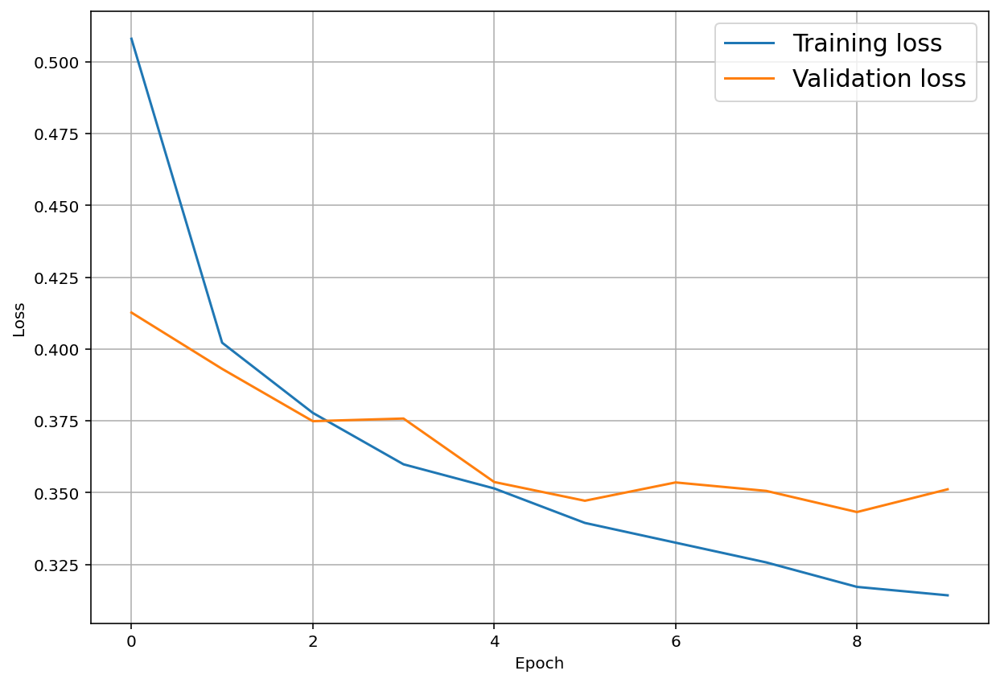

In [39]:
# Plot losses
plt.figure(figsize=(10,7))
plt.plot(train_loss, label='Training loss')
plt.plot(val_loss, label='Validation loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.grid('on')
plt.legend(loc=1,prop={'size': 15})
plt.show()

In [62]:
acc = np.count_nonzero(true==pred)*100/len(true)
print('Accuracy of fine-tuned model:',acc,'%')

print('Accuracy of Homework 1 model: 88.66%')

Accuracy of fine-tuned model: 86.04 %
Accuracy of Homework 1 model: 88.66%



 Confusion matrix (normalized)


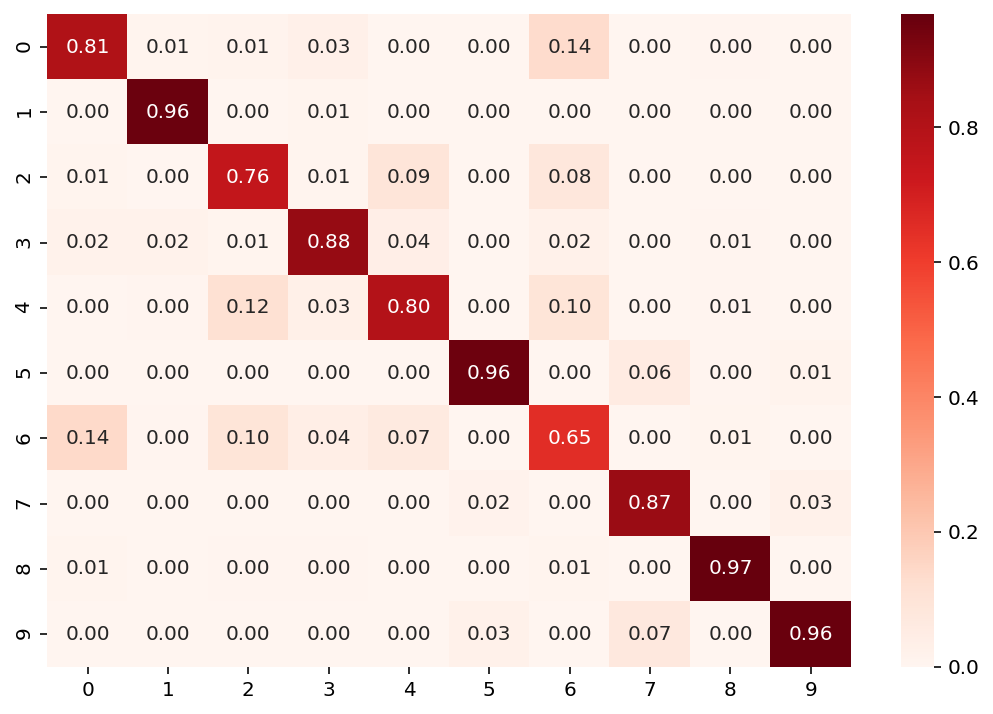

In [51]:
pred, true = predict(test_dataloader, 'cpu')

unique, counts = np.unique(true, return_counts=True)
matrix = confusion_matrix( pred, true)


print("\n Confusion matrix (normalized)")
plt.figure(figsize = (9,6))
sns.heatmap(matrix/counts[:,None], annot=True, fmt =  "1.2f" , cmap="Reds" )
plt.show()

## Autoencoder hyperparameter optimization

This was done using Colab and the cross-validation is not used since the probability of overfitting is quite and low. Beside this we kind of want the model to overfit in the sense that a little overfitting probably clusterize better the labels in the latent dimension

In [8]:
class Encoder(nn.Module):
    def __init__(self, latent_dim, n):

        super().__init__()

        self.conv1 = nn.Conv2d(in_channels=1, out_channels = n, kernel_size=(3,3), padding=1, stride=2)
        self.conv2 = nn.Conv2d(in_channels=n, out_channels = 2*n, kernel_size=(3,3), padding=1, stride=2)
        self.conv3 = nn.Conv2d(in_channels=2*n, out_channels = 4*n, kernel_size=(3,3), padding=0, stride=2)
        
        self.flatten = nn.Flatten(start_dim=1)
        
        self.fc1   = nn.Linear(3 * 3 * 4*n, 20)
        self.fc2   = nn.Linear(20,latent_dim)
        
        #Activation definitions
        self.relu  = nn.ReLU()

        print('Encoder Initialized')

    def forward(self, x, additional_out=False):
        x = self.conv1(x)
        x = self.relu(x)
        x = self.conv2(x)
        x = self.relu(x)
        x = self.conv3(x)
        x = self.relu(x)
        x = self.flatten(x)
        x = self.fc1(x)
        x = self.relu(x)
        x = self.fc2(x)
        return x

In [9]:
class Decoder(nn.Module):
    def __init__(self,latent_dim, n):

        super().__init__()
         
        out_dim = 1       
        
        self.fc1   = nn.Linear(latent_dim,20)
        self.fc2   = nn.Linear(20, 3 * 3 * 4*n)
        
        self.unflatten = nn.Unflatten(dim=1, unflattened_size=(4*n, 3, 3))        

        self.conv1 = nn.ConvTranspose2d(in_channels=4*n, out_channels = 2*n,
                                        kernel_size=(3,3), padding=0, stride = 2, output_padding=0)
        self.conv2 = nn.ConvTranspose2d(in_channels=2*n, out_channels = n,
                                        kernel_size=(3,3), padding=1, stride = 2, output_padding=1)
        self.conv3 = nn.ConvTranspose2d(in_channels=n, out_channels = 1,
                                        kernel_size=(3,3), padding=1, stride = 2, output_padding=1)

        #Activation definitions
        self.relu  = nn.ReLU()
        self.sigmoid = nn.Sigmoid()

        print('Decoder Initialized')

    def forward(self, x, additional_out=False):
        x = self.fc1(x)
        x = self.relu(x)
        x = self.fc2(x)
        x = self.relu(x)
        x = self.unflatten(x)
        x = self.conv1(x)
        x = self.relu(x)
        x = self.conv2(x)
        x = self.relu(x)
        x = self.conv3(x)
        x = self.sigmoid(x) #output values between [0,1]
        return x

In [98]:
def Optuna_create_model(trial):
    
    n_chan = trial.suggest_int("n_channels", 4, 12)
    feature_dim = trial.suggest_int("encoded_space_dim", 2, 10)
    
    encoder = Encoder(latent_dim=feature_dim, n = n_chan)
    decoder = Decoder(latent_dim=feature_dim, n = n_chan)
    
    return nn.Sequential(encoder, decoder)

In [102]:
MAX_EPOCHS = 5

def objective(trial):

    # Generate the model.
    model = Optuna_create_model(trial).to(device)

    # Generate the optimizers.
    optimizer_name = trial.suggest_categorical("optimizer", ["Adam", "RMSprop", "SGD"])
    lr = trial.suggest_float("lr", 1e-5, 1e-1, log=True) 
    weight_decay = trial.suggest_float("weight_decay", 1e-5, 1e0, log=True)
    optimizer = getattr(torch.optim, optimizer_name)(model.parameters(), lr=lr, weight_decay = weight_decay )

    # Get the dataset.
    train_loader, valid_loader = train_dataloader, val_dataloader

    # Training of the model.
    for epoch in tqdm(range(MAX_EPOCHS)):
        
        ############################# TRAINING STEP ###################################
        
        # Set train mode
        model.train()

        # Iterate the dataloader (we do not need the label values, this is unsupervised learning)
        for image_batch, _ in train_loader: # with "_" we just ignore the labels (the second element of the dataloader tuple)
            # Move tensor to the proper device
            image_batch = image_batch.to(device)
            output = model(image_batch)
            
            # Evaluate loss
            optimizer.zero_grad()
            loss = loss_fn(output, image_batch)
            # Backward pass
            loss.backward()
            optimizer.step()
        
        ############################# VALIDATION STEP ###################################
        
        # Set evaluation mode
        model.eval()
        with torch.no_grad(): # No need to track the gradients
            # Define the lists to store the outputs for each batch
            conc_out = []
            conc_label = []
            for image_batch, _ in valid_loader:
                # Move tensor to the proper device
                image_batch = image_batch.to(device)
                output = model(image_batch)

                # Append the network output and the original image to the lists
                conc_out.append(output.cpu())
                conc_label.append(image_batch.cpu())

            # Create a single tensor with all the values in the lists
            conc_out = torch.cat(conc_out)
            conc_label = torch.cat(conc_label) 
            # Evaluate global loss
            val_loss = loss_fn(conc_out, conc_label)
        
        trial.report(val_loss.data, epoch)

        # Handle pruning based on the intermediate value.
        if trial.should_prune():
            raise optuna.exceptions.TrialPruned()

    return val_loss

In [103]:
study = optuna.create_study(direction="minimize", pruner=optuna.pruners.MedianPruner())

[I 2021-11-27 18:57:58,667] A new study created in memory with name: no-name-7c3cb39f-c673-4ab4-be75-562639607bab


In [104]:
loss_fn = torch.nn.MSELoss() #loss function
study.optimize(objective, n_trials = 100)

pruned_trials = study.get_trials(deepcopy=False, states=[TrialState.PRUNED])
complete_trials = study.get_trials(deepcopy=False, states=[TrialState.COMPLETE])

print("Study statistics: ")
print("  Number of finished trials: ", len(study.trials))
print("  Number of pruned trials: ", len(pruned_trials))
print("  Number of complete trials: ", len(complete_trials))

  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [01:21<00:00, 16.21s/it]
[I 2021-11-27 18:59:20,532] Trial 0 finished with value: 0.14688903093338013 and parameters: {'n_channels': 5, 'encoded_space_dim': 7, 'optimizer': 'RMSprop', 'lr': 0.000217521303508016, 'weight_decay': 0.25831593337718994}. Best is trial 0 with value: 0.14688903093338013.
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:07<00:00, 25.46s/it]
[I 2021-11-27 19:01:27,842] Trial 1 finished with value: 0.1923656463623047 and parameters: {'n_channels': 12, 'encoded_space_dim': 8, 'optimizer': 'SGD', 'lr': 3.8818649654678455e-05, 'weight_decay': 0.6361423969760083}. Best is trial 0 with value: 0.14688903093338013.
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [03:48<00:00, 45.64s/it]
[I 2021-11-27 19:05:16,053] Trial 2 finished with value: 0.027770254760980606 and parameters: {'n_channels': 12, 'encoded_space_dim': 3, 'optimizer': 'RMSprop', 'lr': 0.0029164907192523056, 'weight_decay': 1.5332067319004993e-05}. Best is trial 2 with value: 0.027770254760980606.
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [01:43<00:00, 20.76s/it]
[I 2021-11-27 19:06:59,869] Trial 3 finished with value: 0.12502862513065338 and parameters: {'n_channels': 8, 'encoded_space_dim': 6, 'optimizer': 'RMSprop', 'lr': 0.0039803320837180425, 'weight_decay': 0.00670900440832642}. Best is trial 2 with value: 0.027770254760980606.
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [01:31<00:00, 18.35s/it]
[I 2021-11-27 19:08:31,626] Trial 4 finished with value: 0.11511741578578949 and parameters: {'n_channels': 5, 'encoded_space_dim': 4, 'optimizer': 'RMSprop', 'lr': 9.192196461415369e-05, 'weight_decay': 1.6286176570936745e-05}. Best is trial 2 with value: 0.027770254760980606.
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


  0%|                                                                                            | 0/5 [00:19<?, ?it/s]
[I 2021-11-27 19:08:51,038] Trial 5 pruned. 
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


  0%|                                                                                            | 0/5 [00:18<?, ?it/s]
[I 2021-11-27 19:09:09,348] Trial 6 pruned. 
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:09<00:00, 25.93s/it]
[I 2021-11-27 19:11:19,034] Trial 7 finished with value: 0.1246015653014183 and parameters: {'n_channels': 9, 'encoded_space_dim': 5, 'optimizer': 'SGD', 'lr': 0.07821269530933174, 'weight_decay': 2.2830710727002946e-05}. Best is trial 2 with value: 0.027770254760980606.
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


  0%|                                                                                            | 0/5 [00:19<?, ?it/s]
[I 2021-11-27 19:11:38,758] Trial 8 pruned. 
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


  0%|                                                                                            | 0/5 [00:36<?, ?it/s]
[I 2021-11-27 19:12:14,995] Trial 9 pruned. 
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:56<00:00, 35.28s/it]
[I 2021-11-27 19:15:11,458] Trial 10 finished with value: 0.038656800985336304 and parameters: {'n_channels': 12, 'encoded_space_dim': 2, 'optimizer': 'Adam', 'lr': 0.0032381455358569417, 'weight_decay': 0.0005862939852673317}. Best is trial 2 with value: 0.027770254760980606.
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:33<00:00, 30.74s/it]
[I 2021-11-27 19:17:45,182] Trial 11 finished with value: 0.03593422472476959 and parameters: {'n_channels': 12, 'encoded_space_dim': 2, 'optimizer': 'Adam', 'lr': 0.0028227561568435473, 'weight_decay': 0.0002853307613379615}. Best is trial 2 with value: 0.027770254760980606.
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:35<00:00, 31.14s/it]
[I 2021-11-27 19:20:20,889] Trial 12 finished with value: 0.03508172929286957 and parameters: {'n_channels': 11, 'encoded_space_dim': 10, 'optimizer': 'Adam', 'lr': 0.001371532537831182, 'weight_decay': 0.0002737104499569907}. Best is trial 2 with value: 0.027770254760980606.
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:22<00:00, 28.53s/it]
[I 2021-11-27 19:22:43,549] Trial 13 finished with value: 0.024286748841404915 and parameters: {'n_channels': 10, 'encoded_space_dim': 9, 'optimizer': 'Adam', 'lr': 0.0006588621379962305, 'weight_decay': 9.816780444605583e-05}. Best is trial 13 with value: 0.024286748841404915.
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:27<00:00, 29.45s/it]
[I 2021-11-27 19:25:10,841] Trial 14 finished with value: 0.020358849316835403 and parameters: {'n_channels': 10, 'encoded_space_dim': 9, 'optimizer': 'Adam', 'lr': 0.008687625651418831, 'weight_decay': 6.963716305285209e-05}. Best is trial 14 with value: 0.020358849316835403.
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:25<00:00, 29.08s/it]
[I 2021-11-27 19:27:36,259] Trial 15 finished with value: 0.02180762216448784 and parameters: {'n_channels': 10, 'encoded_space_dim': 10, 'optimizer': 'Adam', 'lr': 0.017729689575233267, 'weight_decay': 7.892897927311162e-05}. Best is trial 14 with value: 0.020358849316835403.
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


  0%|                                                                                            | 0/5 [00:20<?, ?it/s]
[I 2021-11-27 19:27:56,283] Trial 16 pruned. 
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:21<00:00, 28.22s/it]
[I 2021-11-27 19:30:17,414] Trial 17 finished with value: 0.02216702327132225 and parameters: {'n_channels': 10, 'encoded_space_dim': 9, 'optimizer': 'Adam', 'lr': 0.012398857282668235, 'weight_decay': 7.714505425917775e-05}. Best is trial 14 with value: 0.020358849316835403.
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:13<00:00, 26.79s/it]
[I 2021-11-27 19:32:31,396] Trial 18 finished with value: 0.021172648295760155 and parameters: {'n_channels': 10, 'encoded_space_dim': 9, 'optimizer': 'Adam', 'lr': 0.016119626764966984, 'weight_decay': 7.878762051732648e-05}. Best is trial 14 with value: 0.020358849316835403.
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


  0%|                                                                                            | 0/5 [00:21<?, ?it/s]
[I 2021-11-27 19:32:52,685] Trial 19 pruned. 
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


  0%|                                                                                            | 0/5 [00:29<?, ?it/s]
[I 2021-11-27 19:33:22,277] Trial 20 pruned. 
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:20<00:00, 28.12s/it]
[I 2021-11-27 19:35:42,925] Trial 21 finished with value: 0.02321550063788891 and parameters: {'n_channels': 10, 'encoded_space_dim': 10, 'optimizer': 'Adam', 'lr': 0.019821088357264538, 'weight_decay': 7.565338178793996e-05}. Best is trial 14 with value: 0.020358849316835403.
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:14<00:00, 26.82s/it]
[I 2021-11-27 19:37:57,070] Trial 22 finished with value: 0.01968805491924286 and parameters: {'n_channels': 9, 'encoded_space_dim': 9, 'optimizer': 'Adam', 'lr': 0.007716469473126197, 'weight_decay': 6.811230303499608e-05}. Best is trial 22 with value: 0.01968805491924286.
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:03<00:00, 24.72s/it]
[I 2021-11-27 19:40:00,678] Trial 23 finished with value: 0.023262741044163704 and parameters: {'n_channels': 9, 'encoded_space_dim': 9, 'optimizer': 'Adam', 'lr': 0.0071949878270521316, 'weight_decay': 0.00013474927831460726}. Best is trial 22 with value: 0.01968805491924286.
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


  0%|                                                                                            | 0/5 [00:18<?, ?it/s]
[I 2021-11-27 19:40:18,881] Trial 24 pruned. 
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:46<00:00, 33.26s/it]
[I 2021-11-27 19:43:05,191] Trial 25 finished with value: 0.02208317443728447 and parameters: {'n_channels': 11, 'encoded_space_dim': 9, 'optimizer': 'Adam', 'lr': 0.034490910209850824, 'weight_decay': 3.845062721533234e-05}. Best is trial 22 with value: 0.01968805491924286.
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


  0%|                                                                                            | 0/5 [00:25<?, ?it/s]
[I 2021-11-27 19:43:30,342] Trial 26 pruned. 
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [01:44<00:00, 20.97s/it]
[I 2021-11-27 19:45:15,243] Trial 27 finished with value: 0.022323086857795715 and parameters: {'n_channels': 7, 'encoded_space_dim': 9, 'optimizer': 'Adam', 'lr': 0.001413922123943637, 'weight_decay': 3.7334844662289804e-05}. Best is trial 22 with value: 0.01968805491924286.
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:34<00:00, 30.82s/it]
[I 2021-11-27 19:47:49,364] Trial 28 finished with value: 0.0235577505081892 and parameters: {'n_channels': 11, 'encoded_space_dim': 7, 'optimizer': 'Adam', 'lr': 0.0004480667224564979, 'weight_decay': 1.0291174338356189e-05}. Best is trial 22 with value: 0.01968805491924286.
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [01:25<00:00, 17.06s/it]
[I 2021-11-27 19:49:14,683] Trial 29 finished with value: 0.02383493073284626 and parameters: {'n_channels': 4, 'encoded_space_dim': 6, 'optimizer': 'Adam', 'lr': 0.032304919769701755, 'weight_decay': 4.144168039803073e-05}. Best is trial 22 with value: 0.01968805491924286.
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


  0%|                                                                                            | 0/5 [00:25<?, ?it/s]
[I 2021-11-27 19:49:40,615] Trial 30 pruned. 
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


 20%|████████████████▊                                                                   | 1/5 [00:54<03:38, 54.58s/it]
[I 2021-11-27 19:50:35,225] Trial 31 pruned. 
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


  0%|                                                                                            | 0/5 [00:25<?, ?it/s]
[I 2021-11-27 19:51:00,627] Trial 32 pruned. 
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:16<00:00, 27.23s/it]
[I 2021-11-27 19:53:16,794] Trial 33 finished with value: 0.022491050884127617 and parameters: {'n_channels': 10, 'encoded_space_dim': 9, 'optimizer': 'Adam', 'lr': 0.001839777874326468, 'weight_decay': 0.00012736973063533924}. Best is trial 22 with value: 0.01968805491924286.
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


  0%|                                                                                            | 0/5 [00:35<?, ?it/s]
[I 2021-11-27 19:53:52,411] Trial 34 pruned. 
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


  0%|                                                                                            | 0/5 [00:23<?, ?it/s]
[I 2021-11-27 19:54:16,191] Trial 35 pruned. 
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:14<00:00, 26.98s/it]
[I 2021-11-27 19:56:31,135] Trial 36 finished with value: 0.019404511898756027 and parameters: {'n_channels': 9, 'encoded_space_dim': 8, 'optimizer': 'Adam', 'lr': 0.004833833740069159, 'weight_decay': 2.4260195169407225e-05}. Best is trial 36 with value: 0.019404511898756027.
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


  0%|                                                                                            | 0/5 [00:20<?, ?it/s]
[I 2021-11-27 19:56:51,341] Trial 37 pruned. 
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


  0%|                                                                                            | 0/5 [00:33<?, ?it/s]
[I 2021-11-27 19:57:24,600] Trial 38 pruned. 
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


  0%|                                                                                            | 0/5 [00:29<?, ?it/s]
[I 2021-11-27 19:57:53,875] Trial 39 pruned. 
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


  0%|                                                                                            | 0/5 [00:23<?, ?it/s]
[I 2021-11-27 19:58:17,489] Trial 40 pruned. 
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


 60%|██████████████████████████████████████████████████▍                                 | 3/5 [01:51<01:14, 37.11s/it]
[I 2021-11-27 20:00:08,835] Trial 41 pruned. 
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:24<00:00, 28.87s/it]
[I 2021-11-27 20:02:33,194] Trial 42 finished with value: 0.019964691251516342 and parameters: {'n_channels': 10, 'encoded_space_dim': 10, 'optimizer': 'Adam', 'lr': 0.011525414077681193, 'weight_decay': 6.336548336624277e-05}. Best is trial 36 with value: 0.019404511898756027.
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


  0%|                                                                                            | 0/5 [00:26<?, ?it/s]
[I 2021-11-27 20:02:59,344] Trial 43 pruned. 
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:49<00:00, 33.81s/it]
[I 2021-11-27 20:05:48,446] Trial 44 finished with value: 0.021089179441332817 and parameters: {'n_channels': 11, 'encoded_space_dim': 8, 'optimizer': 'Adam', 'lr': 0.011847438168792832, 'weight_decay': 5.529084092483459e-05}. Best is trial 36 with value: 0.019404511898756027.
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:48<00:00, 33.75s/it]
[I 2021-11-27 20:08:37,218] Trial 45 finished with value: 0.017869267612695694 and parameters: {'n_channels': 12, 'encoded_space_dim': 8, 'optimizer': 'Adam', 'lr': 0.008883288869749739, 'weight_decay': 1.723046157849056e-05}. Best is trial 45 with value: 0.017869267612695694.
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:38<00:00, 31.72s/it]
[I 2021-11-27 20:11:15,856] Trial 46 finished with value: 0.01878436654806137 and parameters: {'n_channels': 12, 'encoded_space_dim': 7, 'optimizer': 'Adam', 'lr': 0.0020897206352693837, 'weight_decay': 2.249982806954763e-05}. Best is trial 45 with value: 0.017869267612695694.
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


  0%|                                                                                            | 0/5 [00:36<?, ?it/s]
[I 2021-11-27 20:11:52,236] Trial 47 pruned. 
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


  0%|                                                                                            | 0/5 [00:30<?, ?it/s]
[I 2021-11-27 20:12:22,293] Trial 48 pruned. 
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:46<00:00, 33.26s/it]
[I 2021-11-27 20:15:08,629] Trial 49 finished with value: 0.01971852406859398 and parameters: {'n_channels': 12, 'encoded_space_dim': 6, 'optimizer': 'Adam', 'lr': 0.003276010832981211, 'weight_decay': 1.0085532992880597e-05}. Best is trial 45 with value: 0.017869267612695694.
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


  0%|                                                                                            | 0/5 [00:30<?, ?it/s]
[I 2021-11-27 20:15:38,787] Trial 50 pruned. 
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:47<00:00, 33.45s/it]
[I 2021-11-27 20:18:26,080] Trial 51 finished with value: 0.019177723675966263 and parameters: {'n_channels': 12, 'encoded_space_dim': 7, 'optimizer': 'Adam', 'lr': 0.0032275466171344967, 'weight_decay': 2.7947738153756752e-05}. Best is trial 45 with value: 0.017869267612695694.
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:53<00:00, 34.65s/it]
[I 2021-11-27 20:21:19,388] Trial 52 finished with value: 0.02005201019346714 and parameters: {'n_channels': 12, 'encoded_space_dim': 5, 'optimizer': 'Adam', 'lr': 0.004030452845424763, 'weight_decay': 1.508493302972025e-05}. Best is trial 45 with value: 0.017869267612695694.
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:48<00:00, 33.80s/it]
[I 2021-11-27 20:24:08,418] Trial 53 finished with value: 0.018772128969430923 and parameters: {'n_channels': 12, 'encoded_space_dim': 7, 'optimizer': 'Adam', 'lr': 0.003172498545507247, 'weight_decay': 2.3801607978995932e-05}. Best is trial 45 with value: 0.017869267612695694.
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:50<00:00, 34.02s/it]
[I 2021-11-27 20:26:58,562] Trial 54 finished with value: 0.021312545984983444 and parameters: {'n_channels': 11, 'encoded_space_dim': 7, 'optimizer': 'Adam', 'lr': 0.001525803073301737, 'weight_decay': 2.9474021862620827e-05}. Best is trial 45 with value: 0.017869267612695694.
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:51<00:00, 34.21s/it]
[I 2021-11-27 20:29:49,645] Trial 55 finished with value: 0.018029747530817986 and parameters: {'n_channels': 12, 'encoded_space_dim': 7, 'optimizer': 'Adam', 'lr': 0.005596520662856616, 'weight_decay': 1.721085470050269e-05}. Best is trial 45 with value: 0.017869267612695694.
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


  0%|                                                                                            | 0/5 [00:30<?, ?it/s]
[I 2021-11-27 20:30:20,136] Trial 56 pruned. 
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:40<00:00, 32.15s/it]
[I 2021-11-27 20:33:00,897] Trial 57 finished with value: 0.019270367920398712 and parameters: {'n_channels': 12, 'encoded_space_dim': 6, 'optimizer': 'Adam', 'lr': 0.002712748054896965, 'weight_decay': 3.3789898460912796e-05}. Best is trial 45 with value: 0.017869267612695694.
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


  0%|                                                                                            | 0/5 [00:40<?, ?it/s]
[I 2021-11-27 20:33:41,168] Trial 58 pruned. 
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


  0%|                                                                                            | 0/5 [00:29<?, ?it/s]
[I 2021-11-27 20:34:11,131] Trial 59 pruned. 
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


  0%|                                                                                            | 0/5 [00:29<?, ?it/s]
[I 2021-11-27 20:34:40,961] Trial 60 pruned. 
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:49<00:00, 33.93s/it]
[I 2021-11-27 20:37:30,657] Trial 61 finished with value: 0.019207792356610298 and parameters: {'n_channels': 12, 'encoded_space_dim': 7, 'optimizer': 'Adam', 'lr': 0.003226115088476123, 'weight_decay': 1.7024803808190935e-05}. Best is trial 45 with value: 0.017869267612695694.
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:29<00:00, 29.98s/it]
[I 2021-11-27 20:40:00,579] Trial 62 finished with value: 0.02048380672931671 and parameters: {'n_channels': 12, 'encoded_space_dim': 7, 'optimizer': 'Adam', 'lr': 0.005814286355193063, 'weight_decay': 0.00011073691797181157}. Best is trial 45 with value: 0.017869267612695694.
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:26<00:00, 29.34s/it]
[I 2021-11-27 20:42:27,324] Trial 63 finished with value: 0.01897548884153366 and parameters: {'n_channels': 11, 'encoded_space_dim': 7, 'optimizer': 'Adam', 'lr': 0.0030970938513973046, 'weight_decay': 1.7611945266794958e-05}. Best is trial 45 with value: 0.017869267612695694.
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


  0%|                                                                                            | 0/5 [00:27<?, ?it/s]
[I 2021-11-27 20:42:54,977] Trial 64 pruned. 
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


  0%|                                                                                            | 0/5 [00:26<?, ?it/s]
[I 2021-11-27 20:43:21,922] Trial 65 pruned. 
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:29<00:00, 29.99s/it]
[I 2021-11-27 20:45:51,911] Trial 66 finished with value: 0.01862364448606968 and parameters: {'n_channels': 11, 'encoded_space_dim': 8, 'optimizer': 'Adam', 'lr': 0.003475069397211896, 'weight_decay': 1.4082137061519964e-05}. Best is trial 45 with value: 0.017869267612695694.
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


  0%|                                                                                            | 0/5 [00:32<?, ?it/s]
[I 2021-11-27 20:46:24,866] Trial 67 pruned. 
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


  0%|                                                                                            | 0/5 [00:33<?, ?it/s]
[I 2021-11-27 20:46:58,732] Trial 68 pruned. 
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


  0%|                                                                                            | 0/5 [00:32<?, ?it/s]
[I 2021-11-27 20:47:31,306] Trial 69 pruned. 
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:55<00:00, 35.13s/it]
[I 2021-11-27 20:50:26,992] Trial 70 finished with value: 0.01898474432528019 and parameters: {'n_channels': 12, 'encoded_space_dim': 8, 'optimizer': 'Adam', 'lr': 0.008665691759826231, 'weight_decay': 3.116662583482012e-05}. Best is trial 45 with value: 0.017869267612695694.
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:39<00:00, 31.84s/it]
[I 2021-11-27 20:53:06,216] Trial 71 finished with value: 0.018544524908065796 and parameters: {'n_channels': 12, 'encoded_space_dim': 8, 'optimizer': 'Adam', 'lr': 0.0063696170498546935, 'weight_decay': 2.1449881782744513e-05}. Best is trial 45 with value: 0.017869267612695694.
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:32<00:00, 30.43s/it]
[I 2021-11-27 20:55:38,399] Trial 72 finished with value: 0.01771499030292034 and parameters: {'n_channels': 12, 'encoded_space_dim': 8, 'optimizer': 'Adam', 'lr': 0.009008183182834403, 'weight_decay': 2.107001126077851e-05}. Best is trial 72 with value: 0.01771499030292034.
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:48<00:00, 33.60s/it]
[I 2021-11-27 20:58:26,438] Trial 73 finished with value: 0.019077802076935768 and parameters: {'n_channels': 11, 'encoded_space_dim': 8, 'optimizer': 'Adam', 'lr': 0.005595810116057993, 'weight_decay': 4.682726891841877e-05}. Best is trial 72 with value: 0.01771499030292034.
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


 20%|████████████████▊                                                                   | 1/5 [00:59<03:58, 59.63s/it]
[I 2021-11-27 20:59:26,106] Trial 74 pruned. 
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:29<00:00, 29.90s/it]
[I 2021-11-27 21:01:55,637] Trial 75 finished with value: 0.018227091059088707 and parameters: {'n_channels': 11, 'encoded_space_dim': 8, 'optimizer': 'Adam', 'lr': 0.01575211101518529, 'weight_decay': 1.2421838348245364e-05}. Best is trial 72 with value: 0.01771499030292034.
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:48<00:00, 33.70s/it]
[I 2021-11-27 21:04:44,167] Trial 76 finished with value: 0.018642911687493324 and parameters: {'n_channels': 12, 'encoded_space_dim': 8, 'optimizer': 'Adam', 'lr': 0.015189991914063667, 'weight_decay': 1.2688771076782644e-05}. Best is trial 72 with value: 0.01771499030292034.
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:51<00:00, 34.26s/it]
[I 2021-11-27 21:07:35,508] Trial 77 finished with value: 0.020472267642617226 and parameters: {'n_channels': 12, 'encoded_space_dim': 8, 'optimizer': 'Adam', 'lr': 0.015680648745945384, 'weight_decay': 1.3046500437943431e-05}. Best is trial 72 with value: 0.01771499030292034.
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


  0%|                                                                                            | 0/5 [00:37<?, ?it/s]
[I 2021-11-27 21:08:13,294] Trial 78 pruned. 
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


  0%|                                                                                            | 0/5 [00:17<?, ?it/s]
[I 2021-11-27 21:08:30,818] Trial 79 pruned. 
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


  0%|                                                                                            | 0/5 [00:25<?, ?it/s]
[I 2021-11-27 21:08:56,583] Trial 80 pruned. 
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:38<00:00, 31.74s/it]
[I 2021-11-27 21:11:35,322] Trial 81 finished with value: 0.017839303240180016 and parameters: {'n_channels': 12, 'encoded_space_dim': 8, 'optimizer': 'Adam', 'lr': 0.007036633475560791, 'weight_decay': 2.2044151434926218e-05}. Best is trial 72 with value: 0.01771499030292034.
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [03:09<00:00, 37.95s/it]
[I 2021-11-27 21:14:45,088] Trial 82 finished with value: 0.01795942336320877 and parameters: {'n_channels': 12, 'encoded_space_dim': 8, 'optimizer': 'Adam', 'lr': 0.013117767691077524, 'weight_decay': 1.3180205631284487e-05}. Best is trial 72 with value: 0.01771499030292034.
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:18<00:00, 27.65s/it]
[I 2021-11-27 21:17:03,353] Trial 83 finished with value: 0.01805817522108555 and parameters: {'n_channels': 12, 'encoded_space_dim': 8, 'optimizer': 'Adam', 'lr': 0.006678735016441073, 'weight_decay': 1.2329349608401352e-05}. Best is trial 72 with value: 0.01771499030292034.
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:32<00:00, 30.54s/it]
[I 2021-11-27 21:19:36,126] Trial 84 finished with value: 0.01786387339234352 and parameters: {'n_channels': 11, 'encoded_space_dim': 9, 'optimizer': 'Adam', 'lr': 0.0067949779145527805, 'weight_decay': 1.0053236300401489e-05}. Best is trial 72 with value: 0.01771499030292034.
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


 40%|█████████████████████████████████▌                                                  | 2/5 [01:24<02:06, 42.01s/it]
[I 2021-11-27 21:21:00,168] Trial 85 pruned. 
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:15<00:00, 27.16s/it]
[I 2021-11-27 21:23:16,023] Trial 86 finished with value: 0.018059656023979187 and parameters: {'n_channels': 11, 'encoded_space_dim': 9, 'optimizer': 'Adam', 'lr': 0.006452003868130238, 'weight_decay': 1.062741103405563e-05}. Best is trial 72 with value: 0.01771499030292034.
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:24<00:00, 28.95s/it]
[I 2021-11-27 21:25:40,786] Trial 87 finished with value: 0.018155572935938835 and parameters: {'n_channels': 11, 'encoded_space_dim': 9, 'optimizer': 'Adam', 'lr': 0.01025565960773869, 'weight_decay': 1.0145517810598138e-05}. Best is trial 72 with value: 0.01771499030292034.
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:12<00:00, 26.47s/it]
[I 2021-11-27 21:27:53,161] Trial 88 finished with value: 0.016988877207040787 and parameters: {'n_channels': 11, 'encoded_space_dim': 9, 'optimizer': 'Adam', 'lr': 0.009656874105098313, 'weight_decay': 1.0894140548498078e-05}. Best is trial 88 with value: 0.016988877207040787.
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:16<00:00, 27.36s/it]
[I 2021-11-27 21:30:10,005] Trial 89 finished with value: 0.01929381489753723 and parameters: {'n_channels': 11, 'encoded_space_dim': 9, 'optimizer': 'Adam', 'lr': 0.0076908245124647084, 'weight_decay': 3.5257619074698404e-05}. Best is trial 88 with value: 0.016988877207040787.
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


  0%|                                                                                            | 0/5 [00:23<?, ?it/s]
[I 2021-11-27 21:30:34,025] Trial 90 pruned. 
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:19<00:00, 27.87s/it]
[I 2021-11-27 21:32:53,388] Trial 91 finished with value: 0.017960499972105026 and parameters: {'n_channels': 11, 'encoded_space_dim': 9, 'optimizer': 'Adam', 'lr': 0.012656438339489139, 'weight_decay': 1.0140496770642049e-05}. Best is trial 88 with value: 0.016988877207040787.
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:15<00:00, 27.08s/it]
[I 2021-11-27 21:35:08,800] Trial 92 finished with value: 0.017775479704141617 and parameters: {'n_channels': 11, 'encoded_space_dim': 9, 'optimizer': 'Adam', 'lr': 0.009503207752009444, 'weight_decay': 1.0115460034310391e-05}. Best is trial 88 with value: 0.016988877207040787.
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:32<00:00, 30.57s/it]
[I 2021-11-27 21:37:41,685] Trial 93 finished with value: 0.018415596336126328 and parameters: {'n_channels': 12, 'encoded_space_dim': 10, 'optimizer': 'Adam', 'lr': 0.013948400323006765, 'weight_decay': 1.597184142613668e-05}. Best is trial 88 with value: 0.016988877207040787.
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:43<00:00, 32.79s/it]
[I 2021-11-27 21:40:25,671] Trial 94 finished with value: 0.017657944932579994 and parameters: {'n_channels': 12, 'encoded_space_dim': 9, 'optimizer': 'Adam', 'lr': 0.011709853809210323, 'weight_decay': 1.0064571269400434e-05}. Best is trial 88 with value: 0.016988877207040787.
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


  0%|                                                                                            | 0/5 [00:32<?, ?it/s]
[I 2021-11-27 21:40:58,376] Trial 95 pruned. 
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:30<00:00, 30.12s/it]
[I 2021-11-27 21:43:28,992] Trial 96 finished with value: 0.01860017701983452 and parameters: {'n_channels': 12, 'encoded_space_dim': 10, 'optimizer': 'Adam', 'lr': 0.010783574392347945, 'weight_decay': 2.9291527766890725e-05}. Best is trial 88 with value: 0.016988877207040787.
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


  0%|                                                                                            | 0/5 [00:33<?, ?it/s]
[I 2021-11-27 21:44:02,430] Trial 97 pruned. 
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:38<00:00, 31.72s/it]
[I 2021-11-27 21:46:41,063] Trial 98 finished with value: 0.018212437629699707 and parameters: {'n_channels': 11, 'encoded_space_dim': 9, 'optimizer': 'Adam', 'lr': 0.01345882885281117, 'weight_decay': 2.7811410488605934e-05}. Best is trial 88 with value: 0.016988877207040787.
  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

Encoder Initialized
Decoder Initialized


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:38<00:00, 31.67s/it]
[I 2021-11-27 21:49:19,458] Trial 99 finished with value: 0.017863577231764793 and parameters: {'n_channels': 12, 'encoded_space_dim': 10, 'optimizer': 'Adam', 'lr': 0.0046528547874787034, 'weight_decay': 1.0011253185168373e-05}. Best is trial 88 with value: 0.016988877207040787.


NameError: name 'TrialState' is not defined

In [106]:
#optimization_dir = 'optimization'
#pathlib.Path('optimization').mkdir(parents=True, exist_ok=True) 

trials_df = study.trials_dataframe()
trials_df.to_csv('optuna_results_Autoencoder.csv')

print("Best trial:")
trial = study.best_trial
print("  Value: ", trial.value)
opt_network_dictionary = {}
print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value)) 
    opt_network_dictionary.update({key:value})

Best trial:
  Value:  0.016988877207040787
  Params: 
    n_channels: 11
    encoded_space_dim: 9
    optimizer: Adam
    lr: 0.009656874105098313
    weight_decay: 1.0894140548498078e-05


In [107]:
trials_df

,number,value,datetime_start,datetime_complete,duration,params_encoded_space_dim,params_lr,params_n_channels,params_optimizer,params_weight_decay,state
0,0,0.146889,2021-11-27 18:57:59.480108,2021-11-27 18:59:20.532924,0 days 00:01:21.052816,7,0.000218,5,RMSprop,0.258316,COMPLETE
1,1,0.192366,2021-11-27 18:59:20.532924,2021-11-27 19:01:27.842661,0 days 00:02:07.309737,8,0.000039,12,SGD,0.636142,COMPLETE
2,2,0.027770,2021-11-27 19:01:27.842661,2021-11-27 19:05:16.052194,0 days 00:03:48.209533,3,0.002916,12,RMSprop,0.000015,COMPLETE
3,3,0.125029,2021-11-27 19:05:16.054192,2021-11-27 19:06:59.869961,0 days 00:01:43.815769,6,0.003980,8,RMSprop,0.006709,COMPLETE
4,4,0.115117,2021-11-27 19:06:59.874052,2021-11-27 19:08:31.626672,0 days 00:01:31.752620,4,0.000092,5,RMSprop,0.000016,COMPLETE
...,...,...,...,...,...,...,...,...,...,...,...
95,95,0.125161,2021-11-27 21:40:25.673331,2021-11-27 21:40:58.376654,0 days 00:00:32.703323,9,0.019982,11,Adam,0.009237,PRUNED
96,96,0.018600,2021-11-27 21:40:58.379713,2021-11-27 21:43:28.992769,0 days 00:02:30.613056,10,0.010784,12,Adam,0.000029,COMPLETE
97,97,0.043693,2021-11-27 21:43:28.993772,2021-11-27 21:44:02.430896,0 days 00:00:33.437124,9,0.009074,10,RMSprop,0.000020,PRUNED
98,98,0.018212,2021-11-27 21:44:02.431916,2021-11-27 21:46:41.063643,0 days 00:02:38.631727,9,0.013459,11,Adam,0.000028,COMPLETE


In [108]:
print("Best params: ", study.best_params)
print("Best value: ", study.best_value)
print("Best Trial: ", study.best_trial)
print("Trials: ", study.trials)

Best params:  {'n_channels': 11, 'encoded_space_dim': 9, 'optimizer': 'Adam', 'lr': 0.009656874105098313, 'weight_decay': 1.0894140548498078e-05}
Best value:  0.016988877207040787
Best Trial:  FrozenTrial(number=88, values=[0.016988877207040787], datetime_start=datetime.datetime(2021, 11, 27, 21, 25, 40, 792455), datetime_complete=datetime.datetime(2021, 11, 27, 21, 27, 53, 161722), params={'n_channels': 11, 'encoded_space_dim': 9, 'optimizer': 'Adam', 'lr': 0.009656874105098313, 'weight_decay': 1.0894140548498078e-05}, distributions={'n_channels': IntUniformDistribution(high=12, low=4, step=1), 'encoded_space_dim': IntUniformDistribution(high=10, low=2, step=1), 'optimizer': CategoricalDistribution(choices=('Adam', 'RMSprop', 'SGD')), 'lr': LogUniformDistribution(high=0.1, low=1e-05), 'weight_decay': LogUniformDistribution(high=1.0, low=1e-05)}, user_attrs={}, system_attrs={}, intermediate_values={0: 0.02289736643433571, 1: 0.019630348309874535, 2: 0.018057338893413544, 3: 0.017581244

In [114]:
save_study = optuna.create_study(study_name="example-study", storage="sqlite:///example.db'")
save_study.add_trials(study.trials)

[I 2021-11-27 21:51:44,382] A new study created in RDB with name: example-study
<ipython-input-114-5ec85a3b339b>:2: ExperimentalWarning:

add_trials is experimental (supported from v2.5.0). The interface can change in the future.

C:\Users\filip\anaconda3\lib\site-packages\optuna\study\study.py:969: ExperimentalWarning:

add_trial is experimental (supported from v2.0.0). The interface can change in the future.



In [ ]:
# reload study and optimize
study = optuna.load_study(study_name="example-study", storage="sqlite:///example.db", load_if_exists=True)
study.optimize(objective, n_trials=30)

In [109]:
fig = optuna.visualization.plot_param_importances(study)
fig.show()

In [110]:
fig = optuna.visualization.plot_parallel_coordinate(study)
fig.show()

In [111]:
fig = optuna.visualization.plot_intermediate_values(study)
fig.show()

In [112]:
fig = optuna.visualization.plot_optimization_history(study)
fig.show()

In [113]:
fig = optuna.visualization.plot_contour(study, params=["n_channels", "encoded_space_dim"])
fig.show()

## Best Model AutoEncoder

To run the following code it is necessary to run the function definitions of the first convolutional autoencoder

Best trial:
  - Value:  0.016988877207040787
  - Params: 
    - n_channels: 11
    - encoded_space_dim: 9
    - optimizer: Adam
    - lr: 0.009656874105098313
    - weight_decay: 1.0894140548498078e-05

In [15]:
### Set the random seed for reproducible results
torch.manual_seed(123)

### Initialize the two networks
latent_dim = 9
n_channels = 11
encoder = Encoder(latent_dim, n_channels)
decoder = Decoder(latent_dim, n_channels)


Encoder Initialized
Decoder Initialized


  0%|▏                                                                                 | 2/750 [00:00<00:53, 14.05it/s]

EPOCH 1/40


100%|████████████████████████████████████████████████████████████████████████████████| 750/750 [00:27<00:00, 26.93it/s]




	 VALIDATION - EPOCH 1/40 - loss: 0.013934




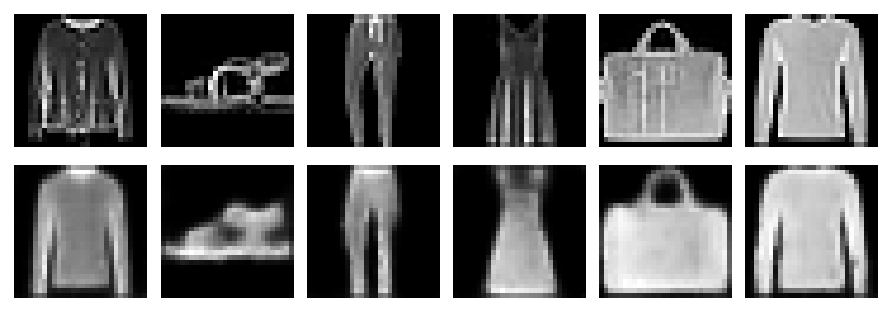

  0%|▎                                                                                 | 3/750 [00:00<00:28, 25.96it/s]

EPOCH 2/40


100%|████████████████████████████████████████████████████████████████████████████████| 750/750 [00:28<00:00, 26.42it/s]




	 VALIDATION - EPOCH 2/40 - loss: 0.013803




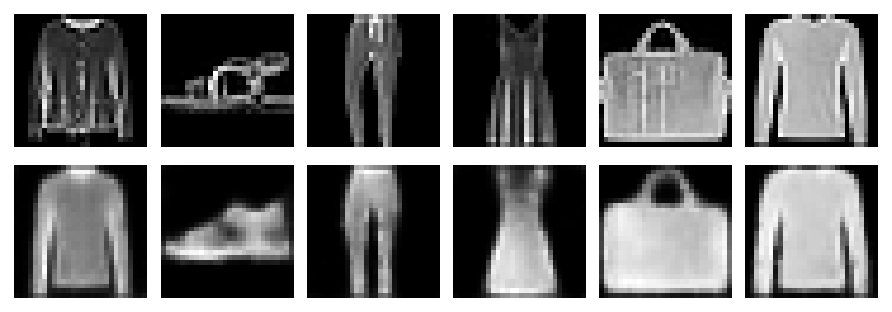

  0%|▎                                                                                 | 3/750 [00:00<00:30, 24.84it/s]

EPOCH 3/40


100%|████████████████████████████████████████████████████████████████████████████████| 750/750 [00:36<00:00, 20.72it/s]




	 VALIDATION - EPOCH 3/40 - loss: 0.013901




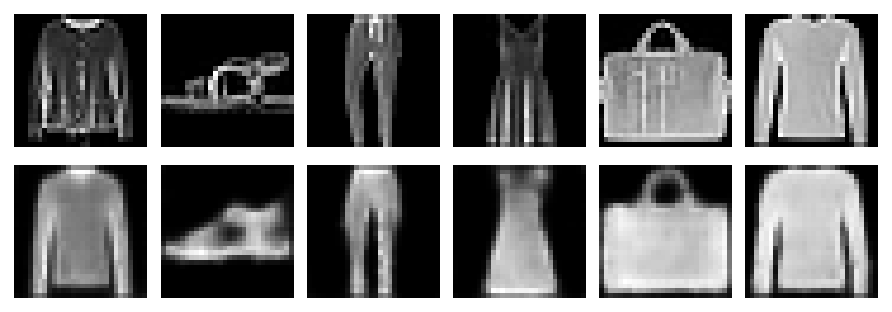

  0%|▏                                                                                 | 2/750 [00:00<00:47, 15.89it/s]

EPOCH 4/40


100%|████████████████████████████████████████████████████████████████████████████████| 750/750 [00:41<00:00, 17.87it/s]




	 VALIDATION - EPOCH 4/40 - loss: 0.013800




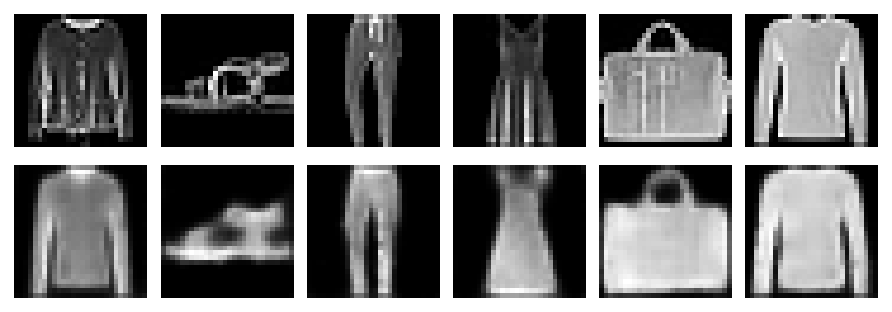

  0%|▏                                                                                 | 2/750 [00:00<00:39, 19.01it/s]

EPOCH 5/40


 14%|███████████                                                                     | 104/750 [00:05<00:34, 18.96it/s]


KeyboardInterrupt: 

In [18]:
num_epochs = 40 #num epochs
loss_fn = torch.nn.MSELoss() #loss function

params_to_optimize = [
    {'params': encoder.parameters()},
    {'params': decoder.parameters()}
]
lr = 2.66e-3
weight_decay = 1.01e-5
optim = torch.optim.Adam(params_to_optimize, lr=lr, weight_decay=weight_decay) #optimizer

training_loss, validation_loss = fit(num_epochs, encoder, decoder,
                                     train_dataloader, test_dataloader, optim, loss_fn, 'cpu', display=True )

In [19]:
dict_ = {0:'T-shirt',1:'Trousers',2:'Pullover',3:'Dress',4:'Coat',
        5:'Sandal',6:'Shirt',7:'Sneaker',8:'Bag',9:'Ankle boot'}

### Get the encoded representation of the test samples
encoded_samples = []
for sample in tqdm(test_dataset):
    img = sample[0].unsqueeze(0).to(device)
    label = sample[1]
    # Encode image
    encoder.eval()
    with torch.no_grad():
        encoded_img  = encoder(img)
    # Append to list
    encoded_img = encoded_img.flatten().cpu().numpy()
    encoded_sample = {f"Variable_{i+1}": enc for i, enc in enumerate(encoded_img)}
    encoded_sample['label'] = label
    encoded_samples.append(encoded_sample)

encoded_samples = pd.DataFrame(encoded_samples)
encoded_samples['Name'] = encoded_samples['label'].map(dict_)
encoded_samples.iloc[:,-4:].head(6)

100%|██████████████████████████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1383.41it/s]


,Variable_8,Variable_9,label,Name
0,-5.465290,8.191526,9,Ankle boot
1,13.057176,-28.641752,2,Pullover
2,-16.199224,-16.607466,1,Trousers
3,-11.142828,-7.605740,1,Trousers
4,5.118183,-5.341930,6,Shirt
5,-5.422873,-13.630280,1,Trousers


In [20]:
tsne = TSNE(n_components=2, init='pca', learning_rate=2000)
encoded_samples_reduced_TSNE = tsne.fit_transform(encoded_samples.iloc[:,0:latent_dim])
encoded_tsne = pd.DataFrame(encoded_samples_reduced_TSNE, columns={'TSNE 1','TSNE 2'})
encoded_tsne = pd.concat([encoded_samples.iloc[:,-2:], encoded_tsne],axis=1)

fig = px.scatter(
    encoded_tsne, x=encoded_tsne['TSNE 1'], y=encoded_tsne['TSNE 2'],
    color=encoded_samples.Name, labels={'color': 'Name'}, opacity=.9,
    symbol='Name',
    #color_discrete_sequence=px.colors.qualitative.Pastel2
)

fig.update_traces(marker=dict(size=10,
                              line=dict(width=.4,
                                        color='Grey')),
                  selector=dict(mode='markers'))
fig.show()

C:\Users\filip\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


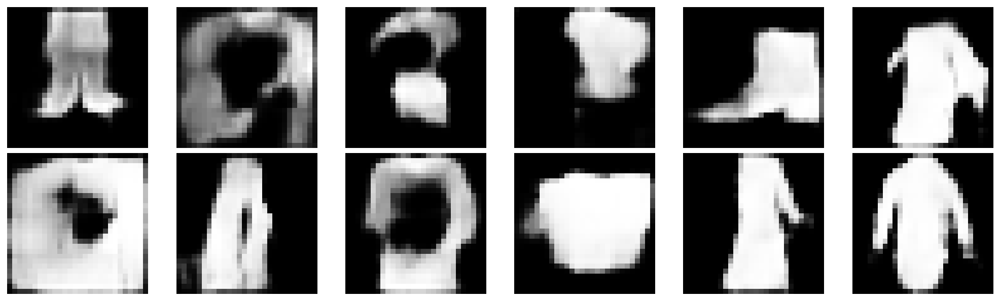

In [56]:
nrow, ncol = 2,6
fig = plt.figure(figsize=(20,20)) 
gs = gridspec.GridSpec(nrow, ncol, width_ratios=[1 for i in range(ncol)],
         wspace=0.2, hspace=0.0, top=1, bottom=0.8, left=0.17, right=0.845) 

#np.random.seed(1411)
for i in range(nrow):
    for j in range(ncol):
        generated=[]
        for k in range(latent_dim):
            x = np.random.randint(min(encoded_samples.iloc[:,k]), 
                                  max(encoded_samples.iloc[:,k]),size=1) 
            generated.append(x)  
        generated = np.array(generated).reshape(1,-1)
        
        
        with torch.no_grad():
            rec_img  = decoder(torch.tensor(generated).float())
            #rec_img  = decoder(encoder(rec_img))
        ax= plt.subplot(gs[i,j])
        ax.imshow(rec_img.cpu().squeeze().numpy(), cmap='gist_gray')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        plt.axis('off')
plt.show()